In [1]:
import numpy as np
# import shtns
import pylab as py
import matplotlib
from tqdm import tqdm
import sys

sys.path.append('/data/pbarpanda/python_scripts/modules/')
import logruns as logruns
import save_and_load_hdf5_files as h5saveload
import eulerian_fluxes as eflux
import netcdf_utilities as ncutil
import os
os.environ["HDF5_USE_FILE_LOCKING"] = 'FALSE'
from tqdm import tqdm
import glob
from PIL import Image

import time as ti
import numpy.ma as ma
import math

sys.path.append('/data/pbarpanda/python_scripts/modules/')
import logruns as logruns
import save_and_load_hdf5_files as h5saveload
import eulerian_fluxes as eflux
import netcdf_utilities as ncutil
from obspy.geodetics import kilometers2degrees
import momentum_advection_class as momentum_advect
from PIL import Image
import imageio
from IPython.display import Video
import scipy.special as special
from scipy import integrate
from IPython.display import Image
import matplotlib.ticker as ticker

# import cmasher as cmr
# cmap = cmr.rainforest                   # CMasher
# cmap = plt.get_cmap('cmr.rainforest')   # MPL

import matplotlib as mpl
from cycler import cycler

mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.edgecolor'] = 'black'
mpl.rcParams['figure.dpi'] = 100
mpl.rcParams['axes.facecolor'] = 'white'
mpl.rcParams['axes.edgecolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['ytick.color'] = 'black'
mpl.rcParams['lines.color'] = 'black'

import os
os.environ["HDF5_USE_FILE_LOCKING"] = 'FALSE'  ### This is because NOAA PSL lab computers are somehow not able to use 

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", 
      [  "darkred", "darkorange", "pink", "white", "white","skyblue", "dodgerblue", "navy"][::-1])


def colorbar(fontsize=20):
    cbar = py.colorbar()
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(fontsize)
    cbar.ax.yaxis.get_offset_text().set_fontsize(fontsize)
    
def colorbar2(fontsize=20, im=None, AX=None, fig=py, ):
    if im is None:
        cbar = fig.colorbar()
    else:
        cbar = fig.colorbar(im, ax=AX)
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(fontsize)
    cbar.ax.yaxis.get_offset_text().set_fontsize(fontsize)

            
import warnings
warnings.filterwarnings('ignore')

import os
import glob

def remove_files(direc):
    files = glob.glob(direc, recursive=True)

    for f in files:
        try:
            os.remove(f)
        except OSError as e:
            print("Error: %s : %s" % (f, e.strerror))
            
def fmt(x, pos):
    a, b = ('%1.2e'%(x)).split('e')
    b = int(b)
    return r'${} \times 10^{{{}}}$'.format(a, b)
fmt1 = ticker.FuncFormatter(fmt)

    
py.rcParams.update({
        "text.usetex": True,
        "font.family": "serif",
        "font.serif": ["Palatino"],
    })


In [2]:
bnd2 = 40

def locate(Y, x, gap=None):
    if gap is None:
        gap = 0.5*np.abs(np.diff(Y))[0] 
    index = np.where(np.abs(Y-x) <= gap)[0][0]
    return index

def eddy(X):
    return X-X.mean(axis=-1)[...,None]

def zmean(X):
    return X.mean(axis=-1)[...,None]

def t_eddy(X):
    return X-X.mean(axis=0)[None,...]

def locate(Y, x, gap=0.1):
    index = np.where(np.abs(Y-x) < gap)[0][0]
    return index

def locate(Y, x, gap=None):
    if gap is None:
        gap = 0.5*np.abs(np.diff(Y))[0] 
    index = np.where(np.abs(Y-x) <= gap)[0][0]
    return index

def tropical(field, bnd1=0, bnd2=20, sign=1):
    field = ma.masked_where(   ((( np.abs(latt) < bnd1)  | ( np.abs(latt) > bnd2))   |   (sign*field < 0) ), field)
    return field.filled(np.nan)

##subtropics
def subtropical(field,  bnd1=20, bnd2=40, sign=1):
    field = ma.masked_where(    ((( np.abs(latt) < bnd1)  | ( np.abs(latt) > bnd2))  |   (sign*field < 0) ) , field)
    return field.filled(np.nan)

def extratropical(field,  bnd1=40, bnd2=80, sign = 1):
    field = ma.masked_where(    ((( np.abs(latt) < bnd1)  | ( np.abs(latt) > bnd2)) |   (sign*field < 0) ), field)
    return field.filled(np.nan)

def forcing_region(field, forcing, sign = 1, scale=4):
    
    max_phi = np.max(forcing)/scale
    field   = ma.masked_where( sign*forcing < max_phi, field)
    return field.filled(np.nan)

def return_max_div_location(field, bnd1=0, bnd2=20, sign = 1):
    
    trop_field        = tropical(field, bnd1=bnd1, bnd2=bnd2, sign=sign)
    max_trop_field    = np.nanmax(trop_field*sign)
    index             = np.where(trop_field*sign == max_trop_field)
    la_pos, lo_pos = latt[index], lonn[index]
    return la_pos, lo_pos

def d_by_dx(lat, lon, field, logging_object=None):
    if logging_object is None:
        logging_object = logruns.default_log(logfilename   = 'momentum',  log_directory = './logs/')
    obj_momentum       = momentum_advect.momentum_advection(field, field, lat, lon, logging_object)            
    dudx  = obj_momentum.spher_div_x(field, lat,  lon, ax=-1)
    return np.squeeze(dudx)

def d_by_dy(lat, lon, field, logging_object=None):
    if logging_object is None:
        logging_object = logruns.default_log(logfilename   = 'momentum',  log_directory = './logs/')
    obj_momentum       = momentum_advect.momentum_advection(field, field, lat, lon, logging_object)            
    dvdy  = obj_momentum.spher_div_y(field, lat,  lon, ax=-2)
    return np.squeeze(dvdy)

def tropical_mask(lat, lon, field, bnd1=0, bnd2=bnd2):    
    lonn, latt = np.meshgrid(lon, lat)
    field = ma.masked_where(   ((( np.abs(latt) < bnd1)  | ( np.abs(latt) > bnd2))   ), field)
    return field.filled(np.nan)

def tropical_mask_outside(lat, lon,  field, bnd1=0, bnd2=bnd2):
    lonn, latt = np.meshgrid(lon, lat)
    field = ma.masked_where(   ((( np.abs(latt) > bnd1)  & ( np.abs(latt) < bnd2))   ), field)
    return field.filled(np.nan)

def Lrange(Y, dy=10):
    mini = np.abs(np.min(Y))
    maxi = np.abs(np.max(Y))
#     maxi = np.round((np.max([(mini), (maxi)])), 0)
    maxi = np.ceil((np.max([(mini), (maxi)])))
    range_values = np.linspace(-maxi, maxi, dy)
    return range_values

def div_func(lat, lon, u, v):
    dvdy = d_by_dy(lat, lon, v, logging_object=None)
    dudx = d_by_dx(lat, lon, u, logging_object=None)
    return dudx + dvdy

# def Lrange(Y, dy=10):
#     mini = np.abs(np.min(Y))
#     maxi = np.abs(np.max(Y))
#     maxi = np.ceil((np.max([(mini), (maxi)])))
#     range_values = np.linspace(-maxi, maxi, dy)
#     return range_values


## Load data

In [3]:
!ls /data/pbarpanda/spherical_SWE/evaluate_final_budget/transient_U_propagate_forcing_diff_Heq/dt_150_Q_forcing_10_forcing_y_0_Hmean_500_forcing_phase_speed_0_ms/*/*/post_process

div_var_name.hdf5	vrt_budget_dict.hdf5	      vrt_vel_decomp_name.hdf5
raw_field_dict.hdf5	vrt_budget_rot_div_dict.hdf5
veloc_decomp_dict.hdf5	vrt_var_name.hdf5


In [4]:
ls /data/pbarpanda/spherical_SWE/evaluate_final_budget/transient_U_propagate_forcing_diff_Heq/

all_exp_combined.hdf5
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_0_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_100_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_150_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_15_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_30_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_40_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_5_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_60_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_200_forcing_phase_speed_80_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_500_forcing_phase_speed_0_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_500_forcing_phase_speed_100_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_500_forcing_phase_speed_150_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_500_forcing_phase_speed_15_ms/
dt_150_Q_forcing_10_forcing_y_0_Hmean_500_forcing_phase_speed_30_ms/
dt_150_Q_fo

In [5]:
source = '/data/pbarpanda/spherical_SWE/evaluate_final_budget/transient_U_propagate_forcing_diff_Heq/'

master_dict = {}

for ps in [0, 5, 15, 30, 40, 60, 80, 100, 150]:
    for Hmean in [200, 500]:
        master_dict['%s_%s'%(Hmean,ps)] = {}
        
        folder_name         = 'dt_150_Q_forcing_10_forcing_y_0_Hmean_%s_forcing_phase_speed_%s_ms/'%(Hmean, ps)
        source2             =  source+folder_name+'/*/*/post_process/'
        post_process_direc  =  glob.glob(source2)
        
        files = os.listdir(post_process_direc[0])
        
        for file in tqdm(files):
             var = file.split('.')[0]
             master_dict['%s_%s'%(Hmean, ps)][var] = h5saveload.load_dict_from_hdf5( post_process_direc[0]+file)
                

100%|██████████| 7/7 [00:08<00:00,  1.15s/it]


In [6]:
import get_size_recursive as gs

In [7]:
master_dict['200_0']['raw_field_dict']['0'].keys()

dict_keys(['PHI', 'U', 'U_max', 'V', 'cf', 'div', 'dvrt_dt', 'lat', 'lon', 'phi_B', 'phi_T', 'phi_forcing', 'vrt'])

In [8]:
gs.get_size(master_dict)/1024**3

5.70766032487154

## Implement PCF mode decomposition

In [9]:
def Dn(n, zeta):
    from scipy.special import hermite as He
    Hn    = He(n)(zeta)
    gauss = np.exp(-(zeta**2)/2)
    pi    = np.pi
    norm  = 2**(-n/2)   #/((np.sqrt(pi)*math.factorial(n))**(1/2.0))
    PCF   = Hn*gauss*norm
    return PCF

def func_2d(n, field, zeta):
    pcf_2d    = Dn(n, zeta)[:, None]
    field_2dd = field[None, :]*pcf_2d ### Only the gaussian thing for now. 
    return field_2dd

def project1d(n, field, zeta):
    rsphere    = 6371e3 
    pcf_2d     = Dn(n, zeta)[:,None]
    field_2dd  = field*pcf_2d ### 
    Norm_Const = (np.sqrt(np.pi)*math.factorial(n))
    project_integrate = integrate.trapz( field_2dd[::-1,:], zeta[::-1], axis=0)/ (Norm_Const)
    return project_integrate

def project2d(n, field, zeta):
    rsphere    = 6371e3 
    pcf_2d     = Dn(n, zeta)[:,None]
    field_2dd  = field*pcf_2d ### 
    Norm_Const = (np.sqrt(np.pi)*math.factorial(n))
    project_integrate = integrate.trapz( field_2dd[::-1,:], zeta[::-1], axis=0)/ (Norm_Const)
    return func_2d(n, project_integrate, zeta)

def mode_decompose(field, mode_nums = [0, 2, 4, 6, 8], zeta=None):
    qms=[]; qmDms=[];
    for m in mode_nums:
        qm   = project1d(m, field, zeta)
        qmDm = project2d(m, field, zeta)        
        qms.append(qm)
        qmDms.append(qmDm)    
    return np.stack(qms), np.stack(qmDms)
        
def lrange(field, NN=25):
       maxi   =  np.nanmax ([ np.abs(np.nanmin(field)), np.abs(np.nanmax(field)) ])
       mini   = -maxi
       eddy_lrange =  np.linspace(mini, maxi, NN)
       return eddy_lrange

#def evaluate_u_v_phi_modes(UMAX = 0.001,  dicti=transient_U, ntrunc_max = 30):

def evaluate_u_v_phi_modes(dicti=master_dict['200_0']['raw_field_dict']['0'], ntrunc_max = 30):
                    
    grav   = 10; 
    Hmean  = ((dicti['PHI']).mean(axis=-1))/grav

    lat = (dicti['lat'])
    lats = np.deg2rad(lat)

    Hmean_tropics = (Hmean[np.abs(lat)<20]).mean()
    R      = 6371e3
    c      = np.sqrt(grav*Hmean_tropics)

    rsphere  = 6371e3
    beta     = 2*(7.29*1e-5/rsphere)  #*np.cos(dicti['lats'])

    ### Calculate second_order_derivatie of U
    U_mean     = (dicti['U']).mean(axis=-1)
    du_dy      = np.gradient(U_mean*np.cos(lats), (lats), axis=0)/(np.cos(lats)*rsphere)
    d2u_dy2    = np.gradient(du_dy, (lats), axis=0)/rsphere
    dU2d2y     = np.polyfit(lats[50:-50]*rsphere, (dicti['U'][50:-50, ...]).mean(axis=-1), 2)[0]

    beta_eff = beta - dU2d2y
    yT   = (np.sqrt(c/beta_eff))/R
    zeta = np.deg2rad(dicti['lat'])/yT

    q      = eddy(dicti['U']) + eddy(dicti['PHI'])/c
    r      = eddy(dicti['U']) - eddy(dicti['PHI'])/c
    v      = eddy(dicti['V'])

    qms, qmDms = mode_decompose(field=q, mode_nums = np.arange(0, ntrunc_max+1, 1), zeta=zeta)
    rms, rmDms = mode_decompose(field=r, mode_nums = np.arange(0, ntrunc_max+1, 1), zeta=zeta)
    vms, vmDms = mode_decompose(field=v, mode_nums = np.arange(0, ntrunc_max+1, 1), zeta=zeta)

    #### Only have symmetric modes in the system
    #### So every alternate mode values should be 0

    u_modes   = []
    v_modes   = []
    phi_modes = []

    for m in np.arange(-1, ntrunc_max-1, 1):

        if m == -1: ### corresponds to Kelvin mode
            u_m   = 1*qmDms[m+1,...]/2
            v_m   = 0*vmDms[m+1,...]  ### Because v component of Kelvin wind is 0
            phi_m = c*qmDms[m+1,...]/2

        elif m == 0: ### corresponds to Kelvin mode
            u_m   = 1*qmDms[m+1,...]/2
            v_m   =     vmDms[m,...]  ### v component of MRG mode
            phi_m = c*qmDms[m+1,...]/2

        else:  ### for n>=1 mode
            u_m   =   (qmDms[m+1,...] + rmDms[m-1,...])/2
            v_m   =   (vmDms[m,...])
            phi_m = c*(qmDms[m+1,...] - rmDms[m-1,...])/2

        u_modes.append(u_m)
        v_modes.append(v_m)
        phi_modes.append(phi_m)

    u_modes   = np.stack(u_modes)
    v_modes   = np.stack(v_modes)
    phi_modes = np.stack(phi_modes)

    fields = {'u_modes' : u_modes, 'v_modes':v_modes, 'phi_modes':phi_modes, \
              'trapping_scale' : np.rad2deg(yT), 'c': c, \
              'beta_eff' : beta_eff, 'dU2d2y': dU2d2y, 'zeta': zeta, \
              'lon':(dicti['lon']), 'lat':(dicti['lat']), \
              'u': eddy(dicti['U']), 'v':eddy(dicti['V']), 'phi':eddy(dicti['PHI']), 
              'mode_nums':np.arange(0, ntrunc_max-1, 1)}  
    return fields
        
        
def eval_modes_for_diff_Umax(dicti=master_dict['200_0'], ntrunc_max = 30):
    
    umax_values = np.sort([int(i) for i in dicti['raw_field_dict'].keys()])    
        
    U_max_dict  = {}
    for UU in tqdm(umax_values):
        ds     = dicti['raw_field_dict'][str(UU)]
        fields = evaluate_u_v_phi_modes(dicti=ds, ntrunc_max = ntrunc_max)
        U_max_dict['%1d'%(UU)] = fields
    return U_max_dict

In [10]:
for key in master_dict.keys():
    print (key)
    master_dict[key]['mode_decomposition'] = eval_modes_for_diff_Umax(dicti = master_dict[key], ntrunc_max = 30)

  0%|          | 0/24 [00:00<?, ?it/s]

200_0


  0%|          | 0/40 [00:00<?, ?it/s]

500_0


  0%|          | 0/24 [00:00<?, ?it/s]

200_5


  0%|          | 0/40 [00:00<?, ?it/s]

500_5


  0%|          | 0/24 [00:00<?, ?it/s]

200_15


  0%|          | 0/40 [00:00<?, ?it/s]

500_15


  0%|          | 0/23 [00:00<?, ?it/s]

200_30


  0%|          | 0/40 [00:00<?, ?it/s]

500_30


  0%|          | 0/23 [00:00<?, ?it/s]

200_40


  0%|          | 0/40 [00:00<?, ?it/s]

500_40


  0%|          | 0/23 [00:00<?, ?it/s]

200_60


  0%|          | 0/40 [00:00<?, ?it/s]

500_60


  0%|          | 0/23 [00:00<?, ?it/s]

200_80


  0%|          | 0/40 [00:00<?, ?it/s]

500_80


  0%|          | 0/23 [00:00<?, ?it/s]

200_100


  0%|          | 0/40 [00:00<?, ?it/s]

500_100


  0%|          | 0/23 [00:00<?, ?it/s]

200_150


  0%|          | 0/40 [00:00<?, ?it/s]

500_150


100%|██████████| 40/40 [00:13<00:00,  2.99it/s]


In [11]:
# h5saveload.save_dict_to_hdf5(master_dict, source+'all_exp_combined.hdf5')

In [12]:
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", 
      ["maroon", "red", "pink",  "white", "white", "skyblue", "dodgerblue", "navy"][::-1])

In [13]:
def plot_modal_decomposition_and_total_field(M_MODES=2, exp = '200_0', umax_key = '0', \
                                             figsize=(20,3), symmetric=True, \
                                             asymmetric=False, vector_scale=0.1):
    
    py.rcParams.update({
            "text.usetex": True,
            "font.family": "serif",
            "font.serif": ["Palatino"],
        })
        
    def vectors(uu, vv, lonn, latt, AX, mag, vector_scale):
        
        Q = AX.quiver(lonn, latt, uu, vv, mag, color='gray', \
                         alpha=1, headwidth=4, headlength=6, width=0.00015*20, scale=vector_scale, \
                         minlength=0)
        return Q, mag
    
    fig, axs = py.subplots(1, M_MODES, figsize= figsize, \
                           sharey=True, \
                           constrained_layout=True,)
    
    AXs      = axs.flatten()
    
    u_v_phi_decomposed = master_dict[exp]['mode_decomposition'][umax_key]
    
    if symmetric:
        MODE_NUMS = u_v_phi_decomposed['mode_nums'][0::2][:M_MODES+1]   ### gives back M_MODES number of modes which are symmetric only
    elif asymmetric:
        MODE_NUMS = u_v_phi_decomposed['mode_nums'][1::2][:M_MODES+1]   ### gives back M_MODES number of modes which are asymmetric only
    else:
        MODE_NUMS = u_v_phi_decomposed['mode_nums'][:M_MODES+1]         ### gives back all M_MODES number of modes both symmetric and asymmetric
    
    lon, lat      = u_v_phi_decomposed['lon'], u_v_phi_decomposed['lat']
    
    lo = 12; 
    la =  5;
    j  =  0;
    
    lmax       = np.round(np.max( np.abs(u_v_phi_decomposed['phi_modes'][list(MODE_NUMS), :]) ))
    LRANGE     = np.linspace(-lmax, lmax, 10)
    
    uuu, vvv   =   u_v_phi_decomposed['u_modes'][list(MODE_NUMS),...], u_v_phi_decomposed['v_modes'][list(MODE_NUMS),...]
    u_mag      =   np.sqrt(uuu**2 + vvv**2)
    vector_max =   np.max(uuu)
    
    for mth_mode, ax in zip(MODE_NUMS, AXs):
        field         =   u_v_phi_decomposed['phi_modes'][mth_mode,...]
        uu, vv        =   u_v_phi_decomposed['u_modes'][mth_mode,...], u_v_phi_decomposed['v_modes'][mth_mode,...]
        im = ax.contourf(lon, lat, field, LRANGE, cmap=cmap, extend='both'); 
  
        Q, mag = vectors(uu[::la, ::lo], vv[::la, ::lo], lon[::lo], lat[::la], ax, vector_max/100, vector_scale)
        
        field = master_dict[exp]['raw_field_dict'][umax_key]['phi_forcing']
        ax.contour(lon, lat, -field, [np.max(np.abs(field))/2], colors='blue', linewidths=6); 
        ax.contour(lon, lat, field, [+np.max(np.abs(field))/2], colors='red',  linewidths=6); 

        ax.tick_params(labelsize=22)
        ax.set_title('n = %d mode'%(mth_mode-1), fontsize=25)
        ax.set_xlabel('longitude', fontsize=25)
        ax.set_ylim(-60, 60)
        
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), location='right', shrink=1, aspect=20, pad=0.01)
    cbar.ax.tick_params(labelsize=18)
    AXs[0].set_ylabel('latitude',  fontsize=25)
    AXs[0].quiverkey(Q, 0.0, 1.15, mag, r'%1.1e $m/s$'%(mag), labelpos='E', coordinates='axes', fontproperties = {'size':20}, labelcolor='k')
    cbar.ax.set_yticklabels(["%1.2f"%(i) for i in cbar.get_ticks()])
    
    fig.show()

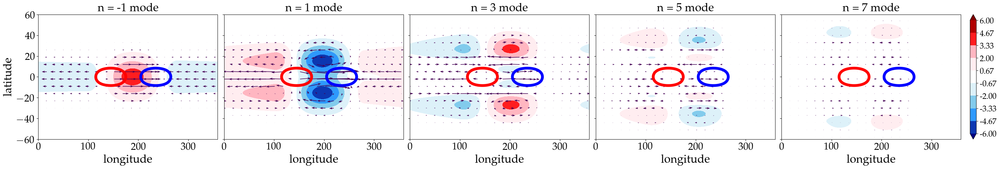

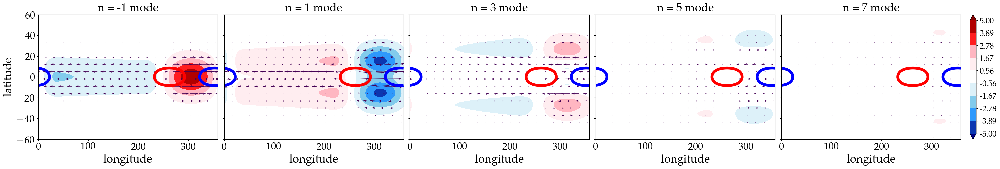

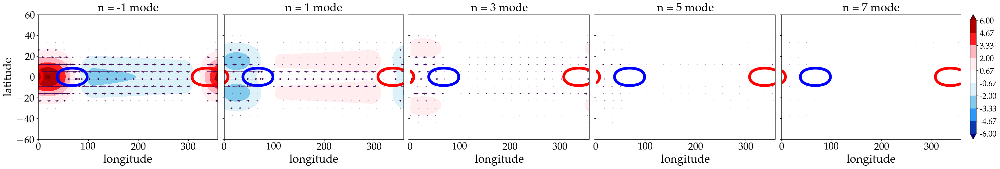

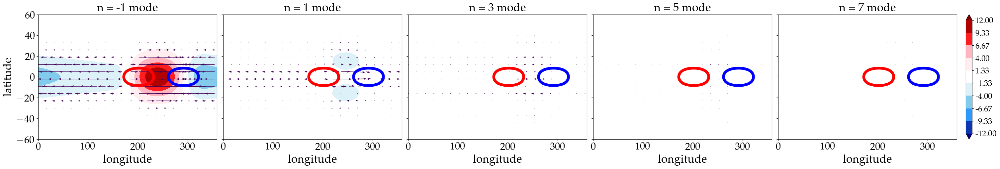

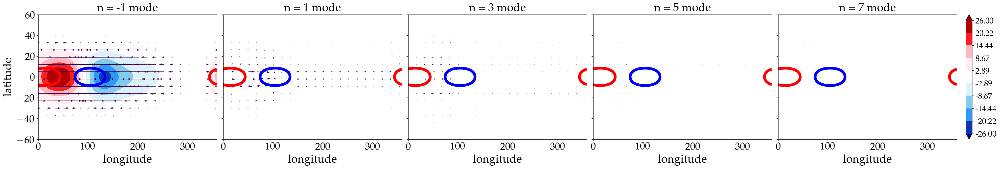

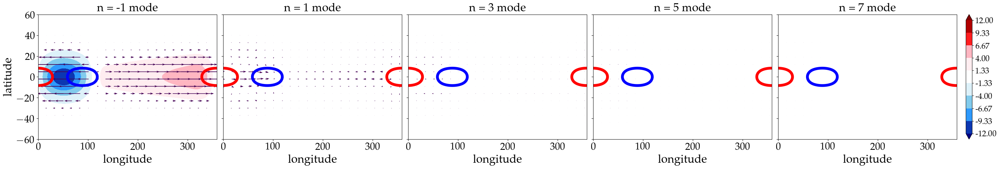

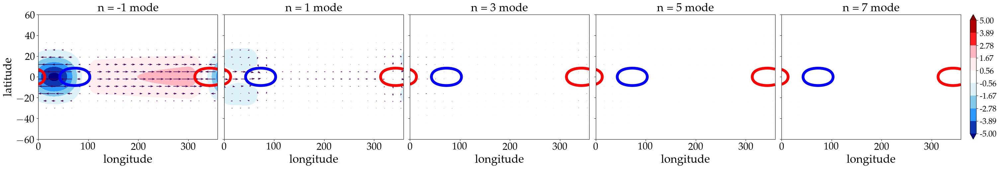

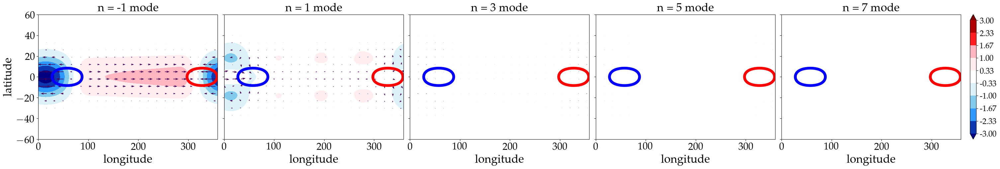

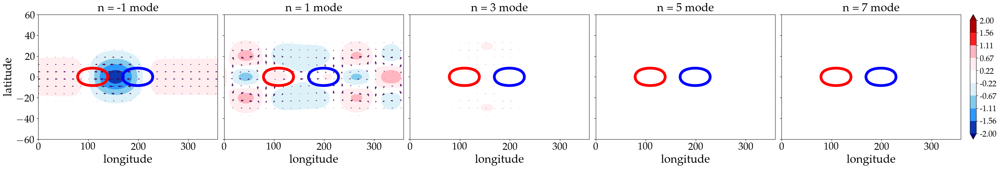

In [13]:
plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_0', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_5',  umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_15', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_30', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_40', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_60', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_80', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_100', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '200_150', umax_key = '0', figsize=(30, 5), vector_scale=1)

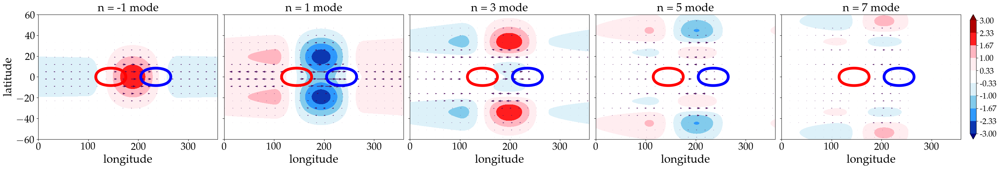

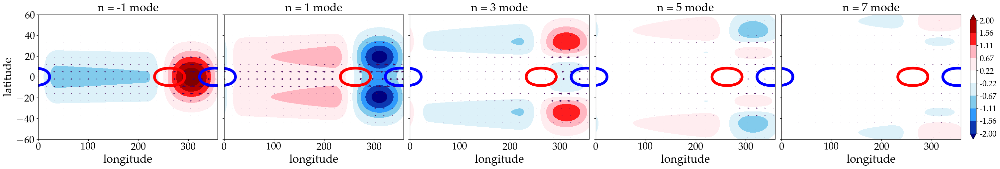

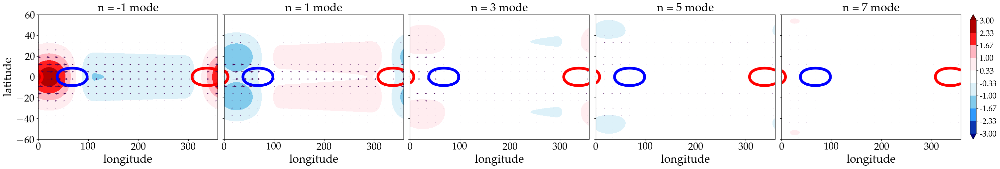

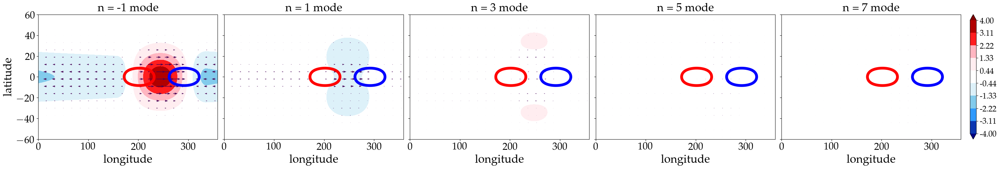

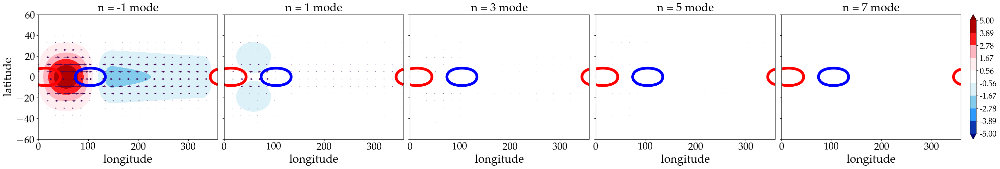

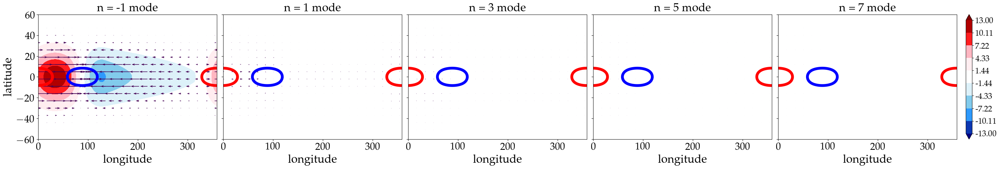

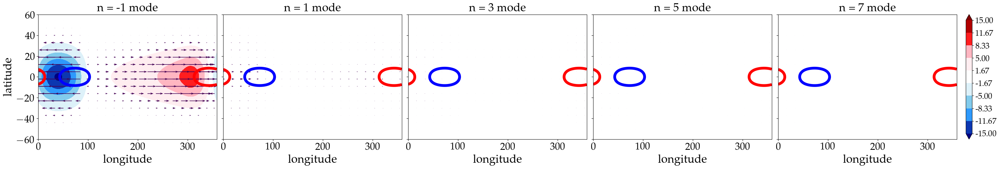

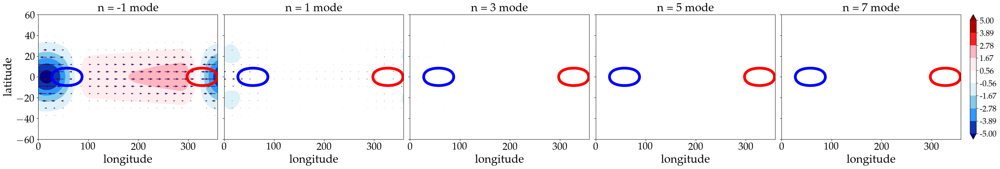

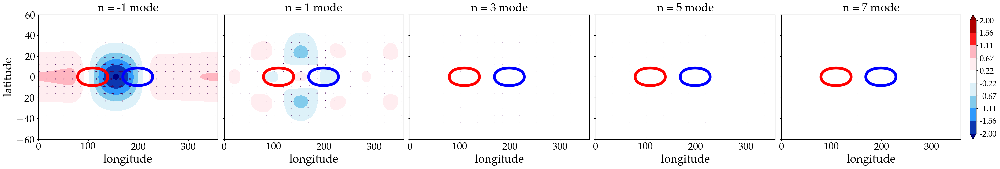

In [15]:
plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_0', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_5',  umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_15', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_30', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_40', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_60', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_80', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_100', umax_key = '0', figsize=(30, 5), vector_scale=1)

plot_modal_decomposition_and_total_field(M_MODES=5, exp = '500_150', umax_key = '0', figsize=(30, 5), vector_scale=1)

### Function to calculate energy decomposition

In [14]:
def energy_matrix(exp = '500_0', umax_key = '0',):
    
    R = 6371e3
    u_v_phi_decomposed = master_dict[exp]['mode_decomposition'][umax_key] 
    
    u_v_phi= np.stack([u_v_phi_decomposed['u_modes'], \
                       u_v_phi_decomposed['v_modes'], \
                       u_v_phi_decomposed['phi_modes']/u_v_phi_decomposed['c']])

    Exy_mn = np.einsum('rmxy,rnxy->mnxy', u_v_phi, u_v_phi)


    lats = np.deg2rad(u_v_phi_decomposed['lat'])
    lons = np.deg2rad(u_v_phi_decomposed['lon'])
    y  = lats[None, None, :, None]
    x  = lons[None, None, :, ]
    dy = np.abs(np.gradient(y, axis=-2))
    dx = np.abs(np.gradient(x, axis=-1))
    Ex_mn = (Exy_mn*R*np.cos(y)*dy).sum(axis=-2)
    E_mn  = (Ex_mn*R*dx).sum(axis=-1)
        
    u = u_v_phi_decomposed['u']
    v = u_v_phi_decomposed['v']
    h = u_v_phi_decomposed['phi']/(u_v_phi_decomposed['c'])
    abs_E_xy = (u**2 + v**2 + h**2)
    abs_E_x  = (abs_E_xy*R*np.cos(y)*dy).sum(axis=-2)
    abs_E    = (abs_E_x*R*dx).sum(axis=-1)
    
    return E_mn, abs_E
       
def return_energy_all_key(master_dict):
    R = 6371e3
    energy_modes={}   
    for exp in tqdm(master_dict.keys()):
        energy_modes[exp]={}
        for umax_key in master_dict[exp]['mode_decomposition'].keys():
            energy_modes[exp][umax_key] = {}
            E_mn, abs_E = energy_matrix(exp = exp, umax_key = umax_key)
            energy_modes[exp][umax_key]['Kelvin'] = E_mn[0,0]
            energy_modes[exp][umax_key]['Rossby'] = E_mn[2,2]
            energy_modes[exp][umax_key]['Emn']    = E_mn
            energy_modes[exp][umax_key]['abs_E']  = abs_E
            energy_modes[exp][umax_key]['rest_modes']  = (np.diag(E_mn).sum()) - \
                                                        -(E_mn[0,0] + E_mn[2,2])            
    return energy_modes
    

In [15]:
energy_modes = return_energy_all_key(master_dict)

100%|██████████| 18/18 [06:54<00:00, 23.02s/it]


In [18]:
energy_modes['200_0'].keys()

dict_keys(['0', '2', '4', '6', '8', '10', '12', '14', '16', '18', '20', '22', '24', '26', '28', '30', '32', '34', '36', '38', '40', '42', '44', '46'])

In [19]:
def plot_energy_modes(exp='200_0', XLIM=(0,48), YLIM=(-1,18)):
    py.figure(figsize=(6,4))
    for key in energy_modes[exp].keys():
        py.plot(int(key), energy_modes[exp][key]['Kelvin']/(10**12), 'ro')
        py.plot(int(key), energy_modes[exp][key]['Rossby']/(10**12), 'bo')
        py.plot(int(key), energy_modes[exp][key]['abs_E']/(10**12), 'ko', mfc='none')

        py.plot(int(key),  energy_modes[exp][key]['abs_E']/(10**12)\
                          - energy_modes[exp][key]['Kelvin']/(10**12)\
                          - energy_modes[exp][key]['Rossby']/(10**12), 'mo', mfc='none')
    py.ylim(*(YLIM))
    py.xlim(*(XLIM))
    py.tick_params(labelsize=18)
    py.xlabel(r'$U_{max}$ [m/s]', fontsize=20)
    py.ylabel('Domain integrated energy \n x $ 10^{12} J/(kgm^2)$', fontsize=20)
    py.show()
    

In [20]:
# energy_modes[].keys()

In [33]:
import string
from datetime import date
today = date.today()

# Month abbreviation, day and year	
today_date = today.strftime("%b-%d-%Y")
print("Today is =", today_date)
print("Have a nice day coding!")

def plot_energy_modes(exps=['200_0'], figsize=(6, 20), XLIM=(0,48), YLIM=(-1,18), filename='thermal_forcing_energy_cf.pdf', save=False):
    

    alphabet = list(string.ascii_lowercase)
    labels   = [('('+alpha+')') for alpha in alphabet]
    grav     = 10

    nrow = 2
    fig, axs = py.subplots(2, len(exps)//nrow, figsize= figsize, \
                       sharey=True, sharex=True, \
                       constrained_layout=True,)
    AXs      = axs.flatten()
    i=-1
    
    
    for exp in exps:
        i=i+1
        KK =[]; RR=[]; ABS_E=[]; HH=[]; Us = []
        
        if exp in energy_modes.keys():
            for key in energy_modes[exp].keys():

                KK.append(np.squeeze(energy_modes[exp][key]['Kelvin']/(10**12)))
                RR.append(np.squeeze(energy_modes[exp][key]['Rossby']/(10**12)))
                ABS_E.append(np.squeeze(energy_modes[exp][key]['abs_E']/(10**12)))
                HH.append( np.squeeze(energy_modes[exp][key]['abs_E']/(10**12)\
                           - energy_modes[exp][key]['Kelvin']/(10**12)\
                            - energy_modes[exp][key]['Rossby']/(10**12)))
                Us.append(int(key))            
                       
        AXs[i].plot(Us, ABS_E, 'm--', mfc='none', lw=4,  alpha=0.5, label='Total energy')
        AXs[i].plot(Us, KK, '-', c='k', label='Kelvin', alpha=0.5, lw=6)
        AXs[i].plot(Us, RR, '-', c='dodgerblue', label='Rossby', lw=6,)
        AXs[i].plot(Us, HH, '-', c='red', alpha=0.5, lw=6, label='Higher-order modes')


        AXs[i].text(0.03, 1.05, labels[i], horizontalalignment='center', verticalalignment='center', transform = AXs[i].transAxes, fontsize=22)

        AXs[i].set_ylim(*(YLIM))
        AXs[i].set_xlim(*(XLIM))
        AXs[i].tick_params(labelsize=18)
        if i<5:
            AXs[i].set_title('$c_{f} = %s$ m/s'%(exp.split('_')[1]), fontsize=20)
    for i in range(3,6):
        AXs[i].set_xlabel(r'$U_{\textrm{jet}}$ [m/s]', fontsize=20)
        
    AXs[i].legend(loc='best', fontsize=20)
    AXs[0]            .set_ylabel('Eddy energy x $ 10^{12}$ \n $J/(kgm^2)$', fontsize=20)
    AXs[len(exps)//2] .set_ylabel('Eddy energy x $ 10^{12}$ \n  $J/(kgm^2)$', fontsize=20)
    fig.suptitle(r'Domain integrated energy for $h_{eq}=%s$m'%(exps[0].split(sep='_')[0]), fontsize=25)
#     fig.suptitle('$H_{eq} = %s m$'%(exp.split('_')[0]), fontsize=25)
    
    if save:
        h5saveload.make_sure_path_exists(('./%s_figures/'%(today_date)))
        py.savefig(('./%s_figures/'%(today_date))+filename, pad_inches=0.5, bbox_inches='tight')
        
    
    fig.show()

    


Today is = Sep-22-2022
Have a nice day coding!


In [53]:
['200_0', '200_5', '200_15', '200_30', '200_40',][0].split(sep='_')

['200', '0']

In [ ]:
['200_0', '200_5', '200_15', '200_30', '200_40',][0].split

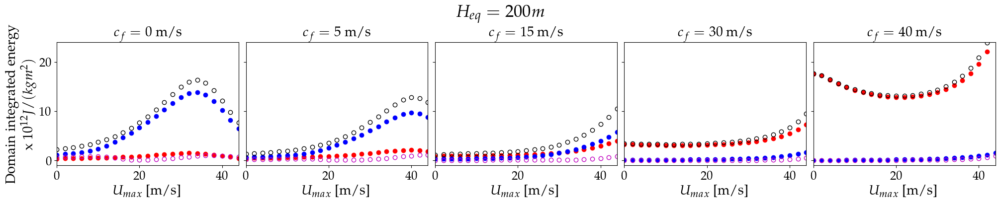

In [24]:
plot_energy_modes(exps=['200_0', '200_5', '200_15', '200_30', '200_40',], \
                  figsize=(20, 4), XLIM=(0,44), YLIM=(-1,24))

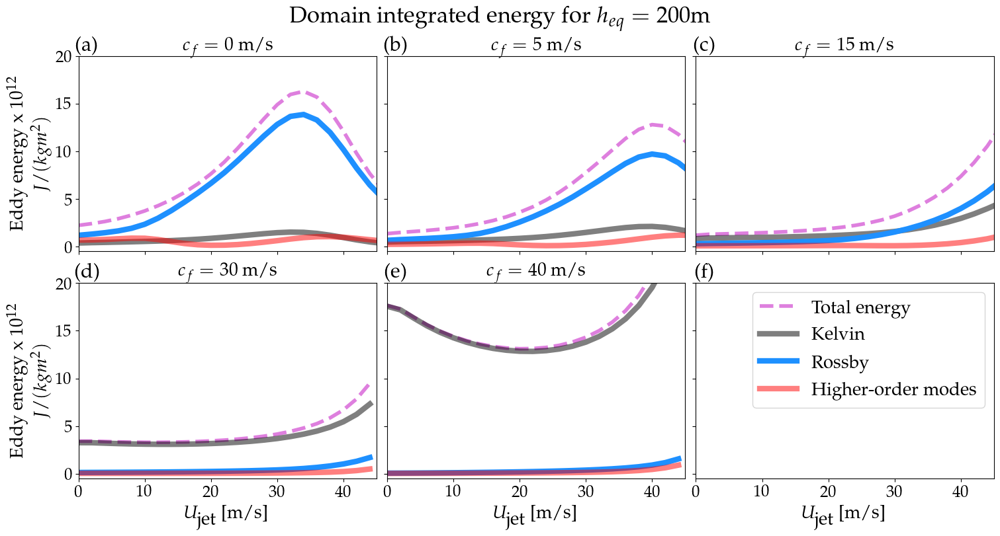

In [34]:
plot_energy_modes(exps=['200_0', '200_5', '200_15', '200_30', '200_40',  ''], \
                  figsize=(15, 8), XLIM=(0,45), YLIM=(-0.5,20), filename='thermal_forcing_energy_cf_200heq.pdf', save=True)

In [35]:
ls /data/pbarpanda/spherical_SWE/jupyter_notebooks/2022_Paper_figures_July/Sep-22-2022_figures

'/data/pbarpanda/spherical_SWE/jupyter_notebooks/2022_Paper_figures_July'

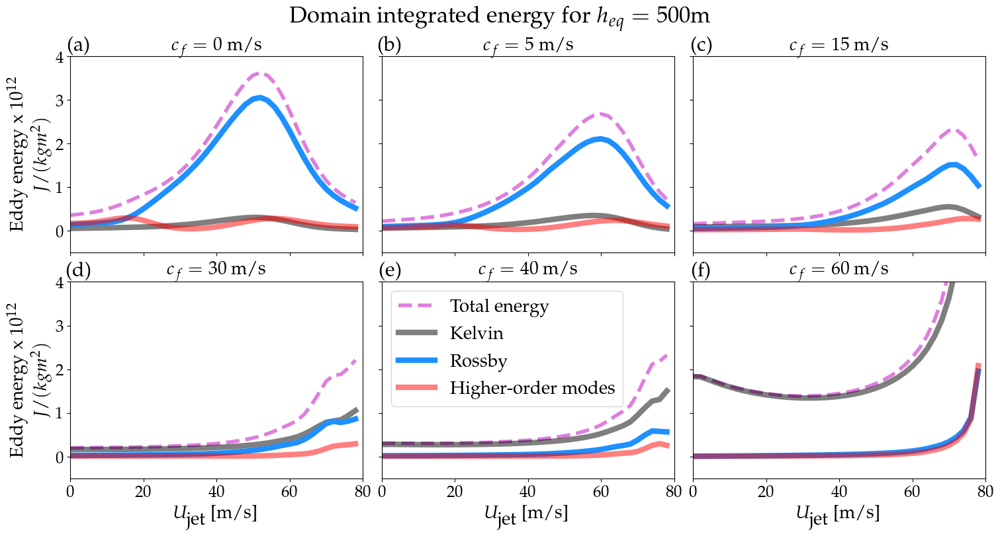

In [59]:
plot_energy_modes(exps=['500_0', '500_5', '500_15', '500_30', '500_40', '500_60',], \
                  figsize=(15, 8), XLIM=(0,80), YLIM=(-0.5,4), filename='thermal_forcing_energy_cf.pdf', save=True)

## Divergence RMS with modes decomposition

$\overline{\left[\phi\right]}D_{rms}^{*}\approx F_{\phi}^{*}\vert_{rms}$

In [70]:
py.rcParams.update( {   "text.usetex": True,
                        "font.family": "serif",
                        "font.serif": ["Palatino"] } )

cmap2 = matplotlib.colors.LinearSegmentedColormap.from_list("", 
      ["maroon", "orangered", "sandybrown", "bisque",  "white", "lightcyan", "skyblue", "dodgerblue", "indigo"][::-1])

R = 6371e3
def rms_near_equator(lat, lon, field, lat_bnd=10):
    forcing_region_field = tropical_mask(lat, lon, field,  0, lat_bnd)
    rms_div              = np.sqrt(np.nanmean(np.nanmean((forcing_region_field**2), axis=-1), axis=-1))
    return rms_div

def latmean_near_equator(lat, lon, field, lat_bnd=10):
    forcing_region_field = tropical_mask(lat, lon, field,  0, lat_bnd)
    rms_div              = (np.nanmean(np.nanmean((forcing_region_field), axis=-1), axis=-1))
    return rms_div

def forcing_region(field, forcing, sign = 1, scale=4):    
    max_phi = np.max(forcing)/scale
    field   = ma.masked_where( sign*forcing < max_phi, field)
    return np.nanmean(field.filled(np.nan))    
    

def return_divergence_change_with_Umax(dicti = master_dict['500_0']):
    
        div_line_data = {}
    
        grav = 9.8
        R = 6371e3 
        umax_values = np.sort([int(i) for i in list(dicti['raw_field_dict'].keys())]) #[::step]
        UMAX = umax_values
        grav = 10

        R= 6371e3
        
        DIV_rms  = []
        DIV_rms_estimate = []
        DIV_modes_rms = []
        DIV_sum_modes_rms = []
        DIV_high_pcf_rms  = []
        
        
        DIV_force           = []
        DIV_modes_force     = []
        DIV_sum_modes_force = []
        DIV_high_pcf_force  = []
        
        c = -1
        for Umax in (UMAX) :
            
            var_name = r'U$_{\textrm{jet}}$ = %1d m/s'%(Umax)    
            ds       = dicti['raw_field_dict'][str(Umax)]
            de       = dicti['vrt_budget_dict'][str(Umax)]
            ds_modes = dicti['mode_decomposition'][str(Umax)] 
            
            SCALE    = R 
            
            forcing  = ds['phi_forcing']/(10*24*3600)
            PHI_mean = latmean_near_equator(ds['lat'], ds['lon'], ds['PHI'])
            field    = SCALE*eddy(de['div']) 
            DIV_rms  .append( rms_near_equator(ds['lat'], ds['lon'], field) )
            DIV_rms_estimate.append( SCALE* rms_near_equator(ds['lat'], ds['lon'], forcing)/PHI_mean )  ######################################
            DIV_force.append( forcing_region(field, forcing, sign = 1, scale=4) )
            
            div_modes = SCALE*div_func(ds['lat'], ds['lon'], ds_modes['u_modes'], ds_modes['v_modes'])
            
            div_modes_forcing = np.zeros(div_modes.shape[0])
            div_modes_rms     = np.zeros(div_modes.shape[0])
            for m in range(div_modes.shape[0]):
                div_modes_rms[m]     = (rms_near_equator(ds['lat'], ds['lon'], div_modes[m,...]) )
                div_modes_forcing[m] = (forcing_region(div_modes[m,...], forcing, sign = 1, scale=4))
            
            
            DIV_high_pcf_rms.append((rms_near_equator(ds['lat'], ds['lon'], div_modes[3:,...].sum(axis=0)) )) 
            DIV_high_pcf_force.append( (forcing_region(div_modes[3:,...].sum(axis=0), forcing, sign = 1, scale=4)) )
            
            DIV_sum_modes_rms.append((rms_near_equator(ds['lat'], ds['lon'], div_modes.sum(axis=0)) )) 
            DIV_sum_modes_force.append( (forcing_region(div_modes.sum(axis=0), forcing, sign = 1, scale=4)) ) 
            
            DIV_modes_rms.append(div_modes_rms)
            DIV_modes_force.append(div_modes_forcing)
    
        
        div_line_data['DIV_rms']             = np.stack(DIV_rms)
        div_line_data['DIV_rms_estimate']    = np.stack(DIV_rms_estimate)
        div_line_data['DIV_force']           = np.stack(DIV_force)
        div_line_data['DIV_sum_modes_rms']   = np.stack(DIV_sum_modes_rms)
        div_line_data['DIV_sum_modes_force'] = np.stack(DIV_sum_modes_force)
        
        div_line_data['DIV_high_pcf_rms']    = np.stack(DIV_high_pcf_rms)
        div_line_data['DIV_high_pcf_force']  = np.stack(DIV_high_pcf_force)

        div_line_data['DIV_modes_rms']       = np.stack(DIV_modes_rms).T
        div_line_data['DIV_modes_force']     = np.stack(DIV_modes_force).T
        div_line_data['Umax']                = UMAX
        
        dicti['div_line_data']               = div_line_data
        
        return dicti


In [71]:
master_dict['500_0'] = return_divergence_change_with_Umax(dicti = master_dict['500_0'])
master_dict['200_0'] = return_divergence_change_with_Umax(dicti = master_dict['200_0'])

In [249]:
py.rcParams.update( { "text.usetex": True,
                      "font.family": "serif",
                     "font.serif": ["Palatino"] } )

cmap2 = matplotlib.colors.LinearSegmentedColormap.from_list("", 
      ["maroon", "orangered", "sandybrown", "bisque",  "white", "lightcyan", "skyblue", "dodgerblue", "indigo"][::-1])

R = 6371e3
    
def plot_divergence_change_with_Umax(dicti = master_dict['500_0'], step=1, \
                                     Uc=50, \
                                     YLIM=(0.01,0.06), AX=None, \
                                     fig=None, c='c', linestyle='-', lw=6):
    
        div_line_data = dicti['div_line_data']
    
        grav = 9.8
        R = 6371e3 
        cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", 
              ["indianred", "orange", "pink", "white", "white","skyblue", "dodgerblue", "navy"][::-1])
        
        umax_values = np.sort([int(i) for i in list(div_line_data['Umax'])])[::step]

        grav     = 10
        
        label = master_dict.keys()
        
        cf    = dicti['raw_field_dict']['0']['cf']
        heq   = (np.ceil(dicti['raw_field_dict']['10']['phi_B']/1000))*100
        label = r'$h_{eq}=%d$ m, $c_{\textrm{f}}=%d$ m/s'%(heq, cf)
                        
#        AX.plot(div_line_data['Umax'], div_line_data['DIV_rms'],   linestyle=linestyle ,   color=c,    lw=lw, label=label, alpha=0.6)
        
        AX.plot(div_line_data['Umax'], div_line_data['DIV_modes_rms'][::2,:][0, :],   linestyle=linestyle ,   color=c,    lw=lw, label=label, alpha=0.6)

        AX.tick_params(labelsize=20)
        AX.set_title(r'Tropical $ \left( R\sqrt {\overline{(\mathbf{\nabla}.\mathbf{v}_K)^2}} \right)$', fontsize=22)
        AX.set_ylabel('Kelvin \n RMS divergence [m/s]', fontsize=25)
        AX.set_xlabel(r'$U_{\textrm{jet}}$ [m/s]', fontsize=25)
        AX.axvline(Uc, color='gray')
        AX.set_ylim(*(YLIM))          
            
        AX.legend(loc='best', fontsize=20, ncol=1, frameon=False)
        AX.tick_params(labelsize=25, )        
        return fig, AX
        

In [226]:
 master_dict['500_15']['raw_field_dict']['10']['phi_B']

4903.0799999999999

In [227]:
master_dict.keys()

dict_keys(['200_0', '500_0', '200_5', '500_5', '200_15', '500_15', '200_30', '500_30', '200_40', '500_40', '200_60', '500_60', '200_80', '500_80', '200_100', '500_100', '200_150', '500_150'])

In [259]:
def combine_various_parameters_plot_divergence(save=True, filename=''):
    
    dict_200 = ['200_0',   '200_5',  '200_15', ]
    dict_500 = ['500_0',  '500_5',   '500_15', ]
    c_200    = ['k', 'b', 'magenta',  ]
    c_500    = ['k', 'b', 'magenta',]
    
    col = 1
    row = 1
    figsize=(15,10)
    fig, axss = py.subplots(row, col, figsize=figsize, constrained_layout=True, sharex=True, sharey=False)
    
    for key, c in zip(dict_200, c_200):
        
#         master_dict[key] = return_divergence_change_with_Umax(dicti = master_dict[key])
        
        plot_divergence_change_with_Umax(dicti = master_dict[key], step=1, \
                                     Uc=30,  YLIM=(0.01,0.20), \
                                     AX=axss, fig=fig, c=c, linestyle='-.', lw=4)

    for key, c in zip(dict_500, c_500):
    
#         master_dict[key] = return_divergence_change_with_Umax(dicti = master_dict[key])
        plot_divergence_change_with_Umax(dicti = master_dict[key], step=1, \
                                     Uc=30,  YLIM=(0.01,0.20), \
                                     AX=axss, fig=fig, c=c, linestyle='-', lw=5)
    
    
    if save:
        h5saveload.make_sure_path_exists(('./%s_figures/'%(today_date)))
        py.savefig(('./%s_figures/'%(today_date))+filename, pad_inches=0.5, bbox_inches='tight')


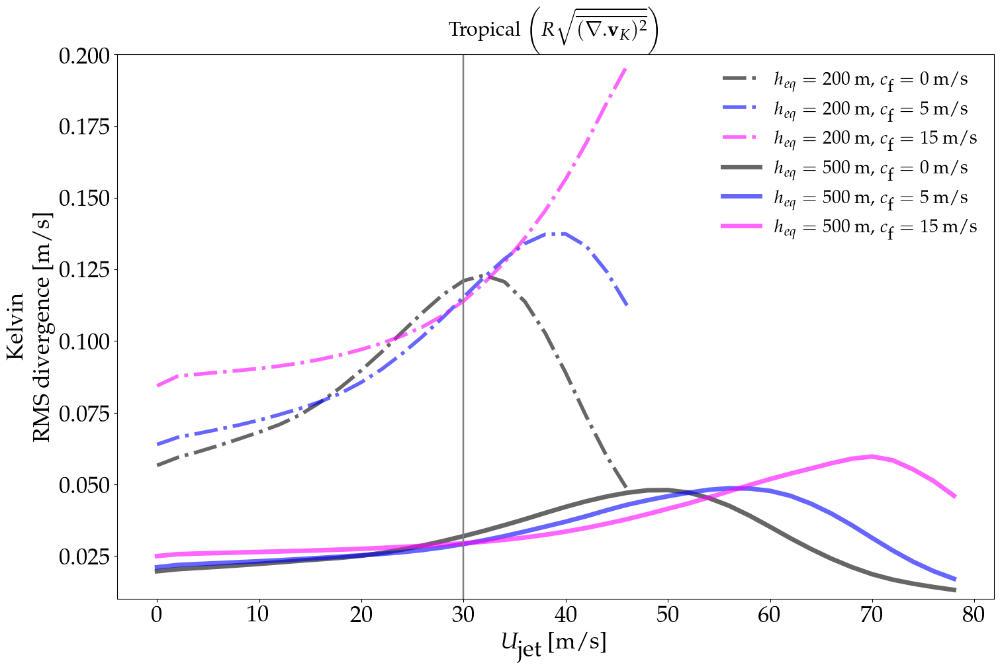

In [260]:
combine_various_parameters_plot_divergence(save=True, filename='Thermal_forcing_Kelvin_div_all_params.pdf')

In [76]:
py.rcParams.update( { "text.usetex": True,
                      "font.family": "serif",
                     "font.serif": ["Palatino"] } )

cmap2 = matplotlib.colors.LinearSegmentedColormap.from_list("", 
      ["maroon", "orangered", "sandybrown", "bisque",  "white", "lightcyan", "skyblue", "dodgerblue", "indigo"][::-1])

R = 6371e3
    
def plot_divergence_change_with_Umax(dictis = master_dict['500_0'], step=1, filename='div_line_eddies_500.pdf', save=False, Uc=50, \
                                     figsize=(20,7), YLIM=(0.01,0.06)):
    
        div_line_data = dicti['div_line_data']
    
        grav = 9.8
        R = 6371e3 
        cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", 
              ["indianred", "orange", "pink", "white", "white","skyblue", "dodgerblue", "navy"][::-1])
        
        umax_values = np.sort([int(i) for i in list(div_line_data['Umax'])])[::step]

        col = 2
        row = 1
        fig, axss = py.subplots(row, col, figsize=figsize, constrained_layout=True, sharex=True, sharey=False)

        axs = axss.T.flatten()

        UMAX     = umax_values
        alphabet = list(string.ascii_lowercase)
        labels   = [('('+alpha+')') for alpha in alphabet]
        grav     = 10
        
        
        c = 0
        AX = axss[c]
        AX.plot(div_line_data['Umax'], div_line_data['DIV_rms'],   'c-' ,          lw=6, label='model result')
        AX.plot(div_line_data['Umax'], div_line_data['DIV_rms_estimate'],  '-.' , c='orange', lw=3, label='linear approx.')
        AX.plot(div_line_data['Umax'], div_line_data['DIV_sum_modes_rms'], 'k--' , lw=2, label='sum of all modes')
        AX.tick_params(labelsize=20)
        AX.set_title(r'Tropical $ \left( R\sqrt {\overline{(\mathbf{\nabla}.\mathbf{v}^{*})^2}} \right)$', fontsize=22)
        AX.set_ylabel('RMS divergence [m/s]', fontsize=25)
        AX.set_xlabel(r'$U_{\textrm{jet}}$ [m/s]', fontsize=25)
        AX.legend(loc='best', fontsize=20)
        AX.text(0.03, 1.05, labels[c], horizontalalignment='center', verticalalignment='center', transform = AX.transAxes, fontsize=22)
        AX.axvline(Uc, color='k')

        
        c = 1
        AX = axss[c]
        MODES_NUM = div_line_data['DIV_modes_rms'].shape[0]
        value  = np.arange(0, MODES_NUM, 2)
        value  = value[:len(value)//2+5]
        dvalue = value[1]-value[0]
        cmap2  = py.get_cmap(py.cm.gist_stern)
               
        AX.plot(div_line_data['Umax'], div_line_data['DIV_modes_rms'][::2,:][0, :], '-', c='black',       lw=6,   label='Kelvin', alpha=0.5)
        AX.plot(div_line_data['Umax'], div_line_data['DIV_modes_rms'][::2,:][1, :], '-', c='dodgerblue',  lw=6,   label='Rossby' )
        AX.plot(div_line_data['Umax'], div_line_data['DIV_high_pcf_rms'],           '-', c='red',         lw=6,   label='Higher-order modes', alpha=0.5)
        AX.set_ylim(*YLIM)  
    
        AX.text(0.03, 1.05, labels[c], horizontalalignment='center', verticalalignment='center', transform = AX.transAxes, fontsize=22)
        AX.legend(loc='best', fontsize=20)
#         AX.legend(bbox_to_anchor=(1.01, 1.0), loc='upper left', fontsize=15)

        AX.tick_params(labelsize=25)
        AX.set_title(r'Tropical $ \left( R\sqrt {\overline{(\mathbf{\nabla}.\mathbf{v}^{*})^2}} \right)$ decomposed into modes', fontsize=22)
        AX.set_xlabel(r'U$_{\textrm{jet}}$ [m/s]', fontsize=25)
        AX.axvline(Uc, color='k')
        
        if save:
            h5saveload.make_sure_path_exists(('./%s_figures/'%(today_date)))
            py.savefig(('./%s_figures/'%(today_date))+filename, pad_inches=0.5, bbox_inches='tight')


In [64]:
master_dict['500_0'].keys()

dict_keys(['raw_field_dict', 'vrt_budget_dict', 'vrt_vel_decomp_name', 'vrt_budget_rot_div_dict', 'veloc_decomp_dict', 'div_var_name', 'vrt_var_name', 'mode_decomposition'])

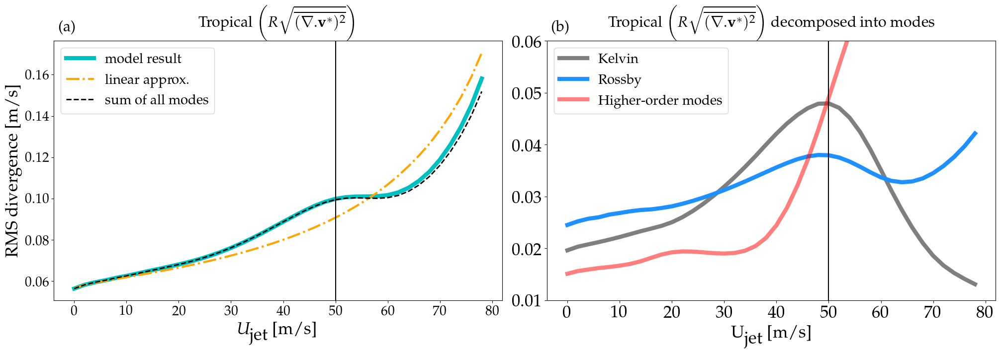

In [72]:
plot_divergence_change_with_Umax(dicti = master_dict['500_0'], step=1, filename='thermal_forcing_div_line_eddies_500.pdf', save=False, Uc=50)

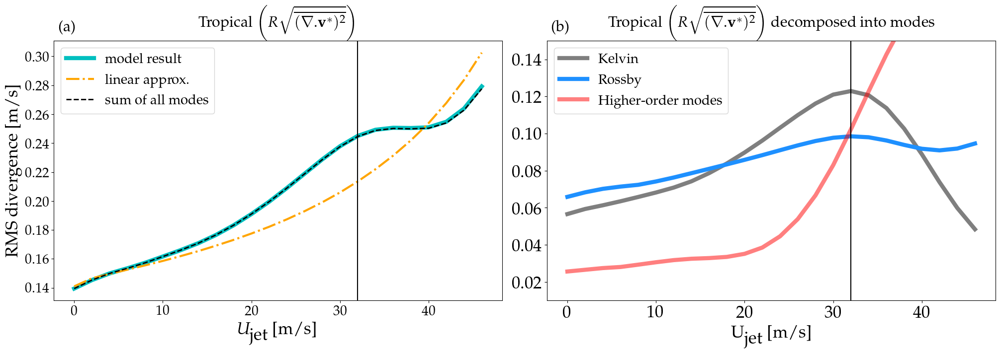

In [81]:
plot_divergence_change_with_Umax(dicti = master_dict['200_0'], step=1, \
                                 filename='thermal_forcing_div_line_eddies_500.pdf', save=False, Uc=32, YLIM=(0.01,0.15))

In [83]:
master_dict['500_5'] = return_divergence_change_with_Umax(dicti = master_dict['500_5'])

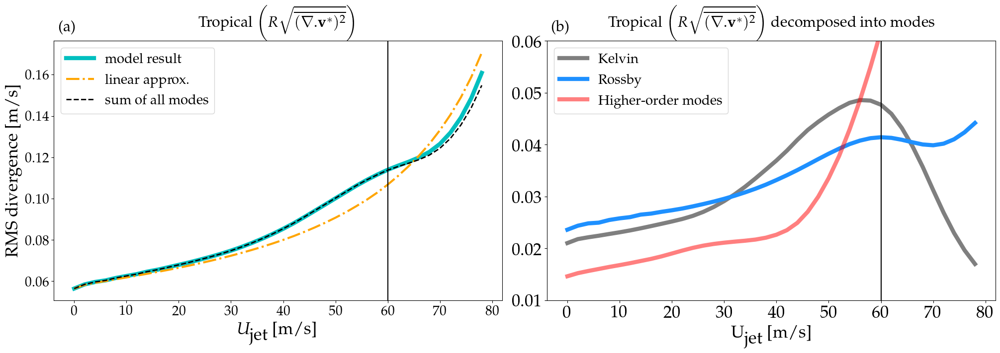

In [85]:
plot_divergence_change_with_Umax(dicti = master_dict['500_5'], step=1, filename='thermal_forcing_div_line_eddies_500.pdf', save=False, Uc=60)

In [86]:
master_dict['200_5'] = return_divergence_change_with_Umax(dicti = master_dict['200_5'])

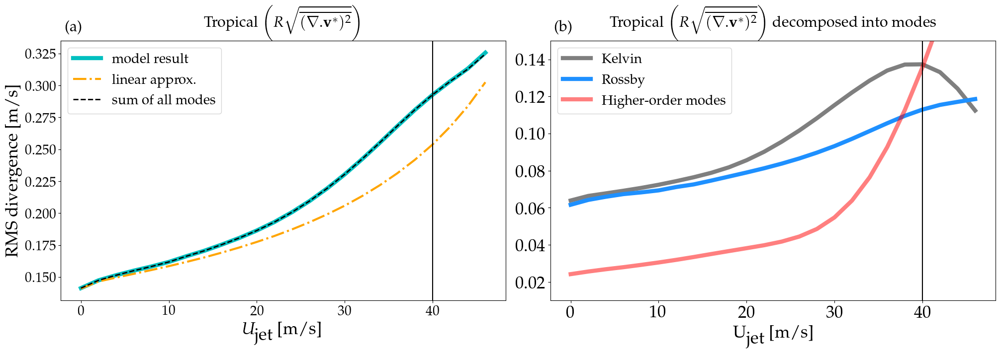

In [88]:
plot_divergence_change_with_Umax(dicti = master_dict['200_5'], step=1, \
                                 filename='/thermal_forcing_div_line_eddies_200_5.pdf', save=False, Uc=40, YLIM=(0.01,0.15))

### Look at divergence and mode decomposition and vorticity budget

In [182]:
master_dict['200_0'].keys()

dict_keys(['vrt_vel_decomp_name', 'vrt_budget_rot_div_dict', 'div_var_name', 'vrt_var_name', 'vrt_budget_dict', 'raw_field_dict', 'veloc_decomp_dict', 'mode_decomposition'])

In [202]:
def vorticity_budget_with_modes_decomposition(exp = '500_0', umax_key = '0',):
    
    ds         = master_dict[exp]['raw_field_dict'][umax_key]
    modes_dict = master_dict[exp]['mode_decomposition'][umax_key]
    VRT_dicti  = master_dict[exp]['vrt_budget_dict'][umax_key]
    abs_vrt    = VRT_dicti['abs_vrt']
    
    
    f = 2*7.2921e-5*np.sin(np.deg2rad(ds['lat']))
    grav = 10

    #### LHS terms
    vrt_x_modes      =   d_by_dx(ds['lat'], ds['lon'] ,modes_dict['v_modes'])
    vrt_y_modes      = - d_by_dy(ds['lat'], ds['lon'], modes_dict['u_modes'])
    vrt_modes        =   vrt_x_modes + vrt_y_modes

    cos_phi   = np.cos(np.deg2rad(ds['lat']))[None, :,None]

    u_abs_vrt_modes = modes_dict['u_modes']*(abs_vrt)[None, ...]
    v_abs_vrt_modes = modes_dict['v_modes']*(abs_vrt)[None, ...]
    

    div_x_modes = d_by_dx(ds['lat'], ds['lon'], modes_dict['u_modes'])
    div_y_modes = d_by_dy(ds['lat'], ds['lon'], modes_dict['v_modes'])
    div_modes   = div_x_modes + div_y_modes
        
    ZETA_a                     = (zmean(abs_vrt)[None,...]) + div_modes*0
    V_mean                     = (zmean(ds['V'])[None,...])
    U_mean                     = (zmean(ds['U'])[None,...])
    #################### Look at the linear terms only ###########################
    
    
    ZETA_a_D_modes             =  div_modes*ZETA_a
    
    beta_term                  =  -(modes_dict['v_modes'])*d_by_dy(ds['lat'], ds['lon'], (ZETA_a /cos_phi))*cos_phi   
    hadley_term                =  -d_by_dy(ds['lat'], ds['lon'], V_mean*vrt_modes)
    zonal_wind_term            =  -d_by_dx(ds['lat'], ds['lon'], U_mean*vrt_modes)
    cf_term                    =  +d_by_dx(ds['lat'], ds['lon'], ds['cf']*vrt_modes)
        
    K_M = 20*24*3600
    damping_term               =  -vrt_modes/K_M
    
    VRT_dicti = {    'div'  : div_modes,   'vrt': vrt_modes,  'abs_vrt':abs_vrt,\
                     'div_x': div_x_modes, 'div_y': div_y_modes, \
                     'vrt_x': vrt_x_modes, 'vrt_y': vrt_y_modes, \
                     'ZETA_a_D': ZETA_a_D_modes , 'beta_term': beta_term, \
                     'hadley_term':hadley_term, 'zonal_wind_term':zonal_wind_term, 'cf_term': cf_term, \
                     'div_mean_winds_vrt': hadley_term + zonal_wind_term,\
                     'D' : eddy(div_modes), 'ZETA_a': ZETA_a, \
                     'lat':ds['lat'], 'lon':ds['lon'], \
                     'damping_term':damping_term, \
                     'dy_ZETA_a': d_by_dy(ds['lat'], ds['lon'], ( ZETA_a/cos_phi)[None,...])*cos_phi}   
    ### Remember to add the 'tendency_term':-eddy(ds['dvrt_dt']),
              
    return VRT_dicti 


def value_near_forcing(field, scale=1.1, forcing=0):
    R = 6371e3
    forcing_region_field = forcing_region( R*field, forcing, sign=2, scale=scale)
    rms_div              = np.nanmean(forcing_region_field)
    return rms_div


def return_near_forcing_key_all_U_all_modes(key='div', exp='500_0'):
    
    DIV_MODES_at_eq    = []
    DIV_at_eq          = []
    DIV_MODE_SUM_at_eq = []    
    
    U_vals = np.array(np.sort([int(U) for U in master_dict[exp]['raw_field_dict'].keys()]))
    
    for umax_val in U_vals:
        
        umax_key   = str(umax_val)
        ds         = master_dict[exp]['raw_field_dict'][umax_key]
        modes_dict = master_dict[exp]['mode_decomposition'][umax_key]
        de         = master_dict[exp]['vrt_budget_dict'][umax_key]
        forcing    = ds['phi_forcing']
                
        de_modes   = vorticity_budget_with_modes_decomposition(exp = exp, umax_key = umax_key,)

        div_modes = eddy(de_modes[key])/(de_modes['ZETA_a'])
        div       = eddy(de[key])/(de['ZETA_a'])
        
        div_modes_at_eq = np.zeros(div_modes.shape[0])
        
        for m in range(de_modes[key].shape[0]):
                       
            div_modes_at_eq[m] = value_near_forcing(div_modes[m,...], forcing=forcing)
            
        div_at_eq          = value_near_forcing(div, forcing=forcing) 
        div_mode_sum_at_eq = value_near_forcing(div_modes.sum(axis=0), forcing=forcing) 
        
        DIV_MODES_at_eq.append(div_modes_at_eq)
        DIV_at_eq.append(div_at_eq)
        DIV_MODE_SUM_at_eq.append(div_mode_sum_at_eq)     
            

    return U_vals, np.stack(DIV_MODES_at_eq), \
           np.stack(DIV_at_eq), np.stack(DIV_MODE_SUM_at_eq)



from matplotlib.colors import BoundaryNorm

def plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax(mode_vorticity_eq={}, CMAP=py.cm.seismic, exp='500_0'):
    
    keys = ['ZETA_a_D', 'beta_term', 'hadley_term', 'zonal_wind_term', 'cf_term']
    var_name             = master_dict['200_0']['vrt_var_name']
    var_name['cf_term']  = r'$ -\Delta (\partial_x\left({c_{f}\zeta^{*}}\right)  / \overline{\zeta_a}) $'

    def lrange(field, NN=10):
        maxi   =  +np.nanmax ([ np.abs(np.nanmin(field)), np.abs(np.nanmax(field)) ])
        mini   =  -maxi
        eddy_lrange =  np.linspace(mini, maxi, NN)
        return eddy_lrange

    fig, axs = py.subplots(1, 5, figsize=(30,5),  sharex=True,  sharey=True, constrained_layout=True) # #

    if mode_vorticity_eq == {}:
        no_dict = True 
    else:
        no_dict = False
    
    if no_dict:
        mode_vorticity_eq = {}
    
    for key, AX in (zip(keys, axs.flatten())):
        
        if no_dict:
            mode_vorticity_eq[key] = {}
            U_vals, DIV_MODES_at_eq, DIV_at_eq, DIV_MODE_SUM_at_eq = return_near_forcing_key_all_U_all_modes(\
                                                                     key=key, exp=exp)
            
        else:
            U_vals, DIV_MODES_at_eq, DIV_at_eq, DIV_MODE_SUM_at_eq = mode_vorticity_eq[key]['U_vals'],\
                                                                     mode_vorticity_eq[key]['DIV_MODES_at_eq'],\
                                                                     mode_vorticity_eq[key]['DIV_at_eq'],\
                                                                     mode_vorticity_eq[key]['DIV_MODE_SUM_at_eq']

        MODE_NUMS = DIV_MODES_at_eq.shape[-1]
        MODE_NUMS = np.arange(0.75,  MODE_NUMS+0.75, 1)[::2]

        field = (DIV_MODES_at_eq[:,::2].T - (DIV_MODES_at_eq[0,None,::2].T))
#         levels =  lrange(field)
        if key != 'ZETA_a_D':
            levels = [-0.3, 0.3]
        else:
            levels =  lrange(field)
        norm = BoundaryNorm(levels, ncolors=cmap.N, clip=False)

        sm = AX.pcolormesh(U_vals, MODE_NUMS, field, cmap=CMAP, vmin = levels[0], vmax = levels[-1])
    
        
        AX.set_title(var_name[key]+'$/\overline{\zeta_a}$', fontsize=20) 
        
        yticks = ['%1d'%(i) for i in (MODE_NUMS-0.75)]
        AX.set_yticks(MODE_NUMS, yticks)
        AX.tick_params(labelsize=20)
        AX.set_ylim(0, 11+0.5)
        AX.set_xlabel(r'$U_{max} [m/s]$', fontsize=20)
        
        cbar = fig.colorbar(sm, ax=AX, location='right', aspect=30, shrink=1)
        cbar.ax.tick_params(labelsize=18)
         
        if no_dict:
            mode_vorticity_eq[key]['U_vals']             = U_vals
            mode_vorticity_eq[key]['DIV_MODES_at_eq']    = DIV_MODES_at_eq
            mode_vorticity_eq[key]['DIV_at_eq']          = DIV_at_eq
            mode_vorticity_eq[key]['DIV_MODE_SUM_at_eq'] = DIV_MODE_SUM_at_eq   
            
    AX = axs.flatten()       
    AX[0].set_ylabel('meridional mode num', fontsize=20)
#   AX[2].set_ylabel('meridional mode num', fontsize=20)
    return mode_vorticity_eq
        

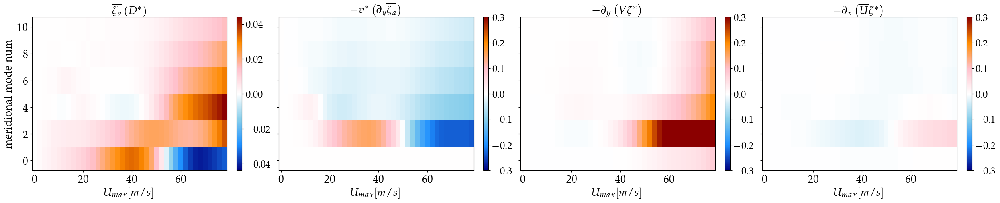

In [201]:
mode_vorticity_eq={}
exp = '500_0'

cmap2 = matplotlib.colors.LinearSegmentedColormap.from_list("", 
       ["darkred", "darkorange", "pink", "white","skyblue", "dodgerblue", "navy"][::-1])
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax({}, cmap2, exp=exp)

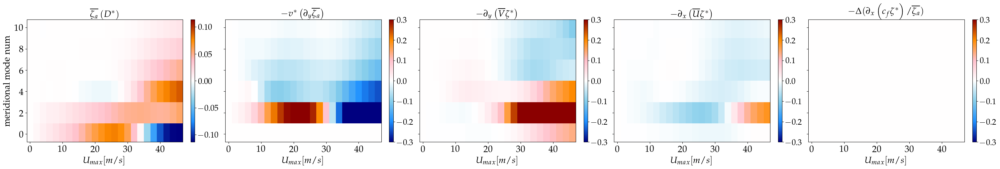

In [203]:
exp='200_0'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax({}, cmap2, exp=exp)

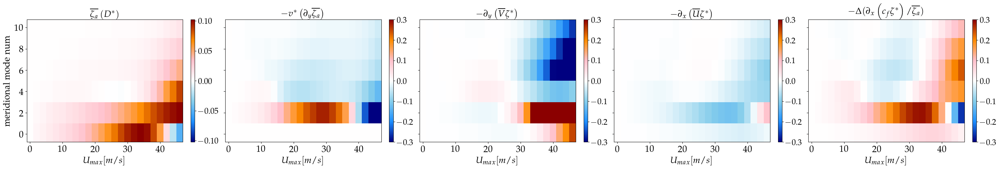

In [204]:
exp='200_5'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax({}, cmap2, exp=exp)

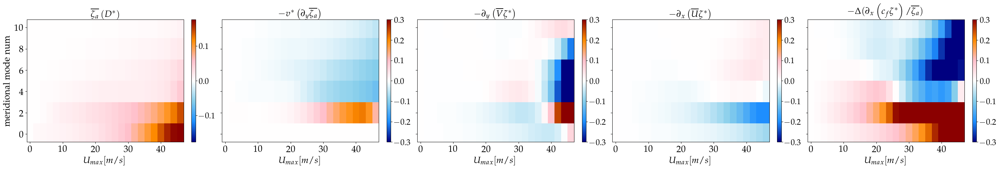

In [205]:
exp='200_15'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax({}, cmap2, exp=exp)

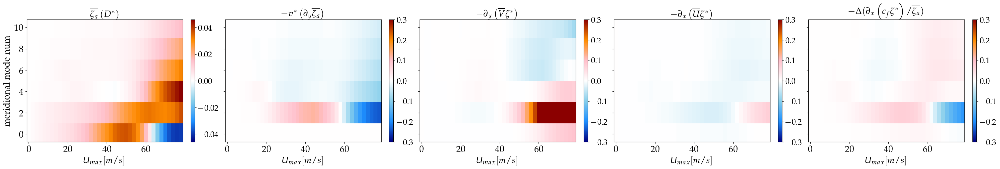

In [206]:
exp='500_5'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax({}, cmap2, exp=exp)

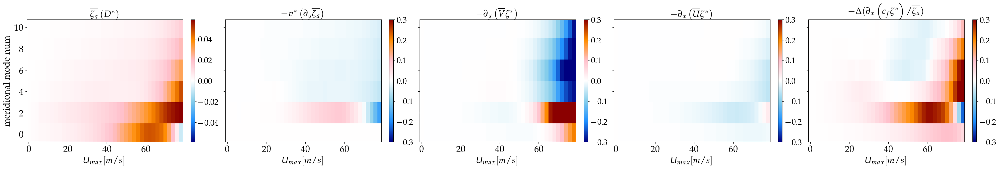

In [207]:
exp='500_15'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax({}, cmap2, exp=exp)

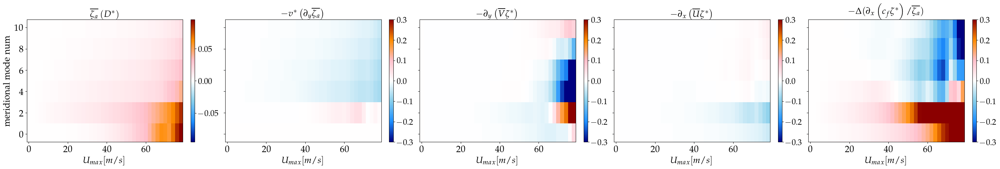

In [208]:
exp='500_30'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax({}, cmap2, exp=exp)

In [222]:
def plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax1(mode_vorticity_eq={}, CMAP=py.cm.seismic, exp='500_0'):
    
    keys = ['ZETA_a_D', 'beta_term', 'hadley_term', 'zonal_wind_term', 'cf_term']
    var_name             = master_dict['200_0']['vrt_var_name']
    var_name['cf_term']  = r'$ -\Delta (\partial_x\left({c_{f}\zeta^{*}}\right)  / \overline{\zeta_a}) $'

    def lrange(field, NN=10):
        maxi   =  +np.nanmax ([ np.abs(np.nanmin(field)), np.abs(np.nanmax(field)) ])
        mini   =  -maxi
        eddy_lrange =  np.linspace(mini, maxi, NN)
        return eddy_lrange

    fig, axs = py.subplots(1, 5, figsize=(30,5),  sharex=True,  sharey=True, constrained_layout=True) # #

    if mode_vorticity_eq == {}:
        no_dict = True 
    else:
        no_dict = False
    
    if no_dict:
        mode_vorticity_eq = {}
    
    for key, AX in (zip(keys, axs.flatten())):
        
        if no_dict:
            mode_vorticity_eq[key] = {}
            U_vals, DIV_MODES_at_eq, DIV_at_eq, DIV_MODE_SUM_at_eq = return_near_forcing_key_all_U_all_modes(\
                                                                     key=key, exp=exp)
            
        else:
            U_vals, DIV_MODES_at_eq, DIV_at_eq, DIV_MODE_SUM_at_eq = mode_vorticity_eq[key]['U_vals'],\
                                                                     mode_vorticity_eq[key]['DIV_MODES_at_eq'],\
                                                                     mode_vorticity_eq[key]['DIV_at_eq'],\
                                                                     mode_vorticity_eq[key]['DIV_MODE_SUM_at_eq']

#         MODE_NUMS = DIV_MODES_at_eq.shape[-1]
#         MODE_NUMS = np.arange(0.75,  MODE_NUMS+0.75, 1)[::2]

        MODE_NUMS = [0+0.75, 2+0.75, 4+0.75]
        field2 = (DIV_MODES_at_eq[:,::2].T - (DIV_MODES_at_eq[0,None,::2].T))
        field_excess = field2[2:,:].sum(axis=0)       
        field  = np.append(field2[0:2,:],field_excess[None,:], axis=0 )
#         print (field.shape)
        
        if key != 'ZETA_a_D':
            levels = [-0.3, 0.3]
        else:
            levels =  lrange(field)
        norm = BoundaryNorm(levels, ncolors=cmap.N, clip=False)

        sm = AX.pcolormesh(U_vals, MODE_NUMS, field, cmap=CMAP, vmin = levels[0], vmax = levels[-1])
    
        
        AX.set_title(var_name[key]+'$/\overline{\zeta_a}$', fontsize=20) 
        
        yticks = ['0', '2', '$\geq$ 3'] #['%1d'%(i) for i in MODE_NUMS] #(MODE_NUMS-0.75)]
        AX.set_yticks(MODE_NUMS, yticks)
        AX.tick_params(labelsize=20)
#         AX.set_ylim(0, 3+0.5)
        AX.set_xlabel(r'$U_{max} [m/s]$', fontsize=20)
        
        cbar = fig.colorbar(sm, ax=AX, location='right', aspect=30, shrink=1)
        cbar.ax.tick_params(labelsize=18)
         
        if no_dict:
            mode_vorticity_eq[key]['U_vals']             = U_vals
            mode_vorticity_eq[key]['DIV_MODES_at_eq']    = DIV_MODES_at_eq
            mode_vorticity_eq[key]['DIV_at_eq']          = DIV_at_eq
            mode_vorticity_eq[key]['DIV_MODE_SUM_at_eq'] = DIV_MODE_SUM_at_eq   
            
    AX = axs.flatten()       
    AX[0].set_ylabel('meridional mode num', fontsize=20)
#   AX[2].set_ylabel('meridional mode num', fontsize=20)
    return mode_vorticity_eq
        

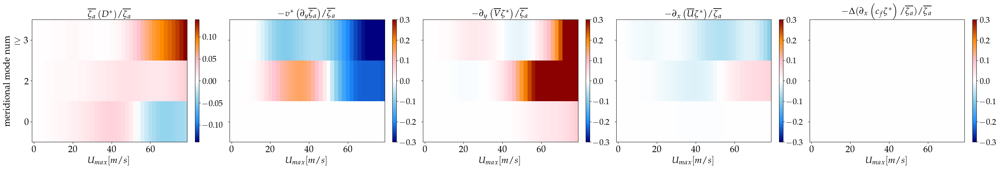

In [223]:
mode_vorticity_eq={}
exp='500_0'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax1({}, cmap2, exp=exp)

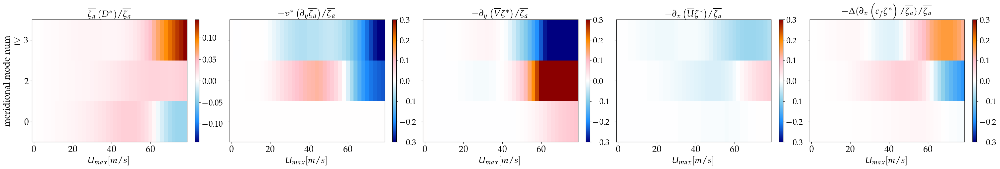

In [224]:
exp='500_5'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax1({}, cmap2, exp=exp)

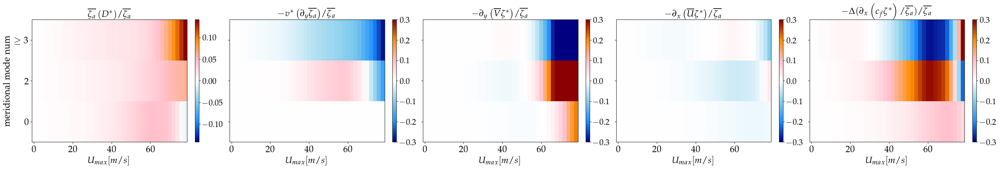

In [225]:
exp='500_15'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax1({}, cmap2, exp=exp)

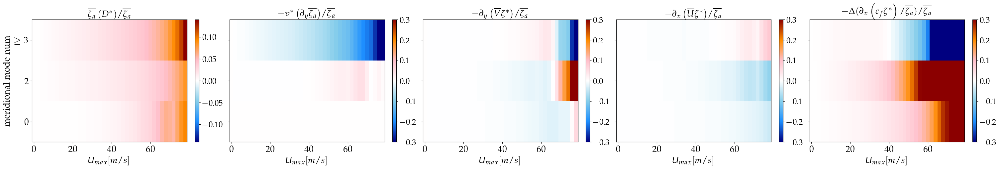

In [226]:
exp='500_30'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax1({}, cmap2, exp=exp)

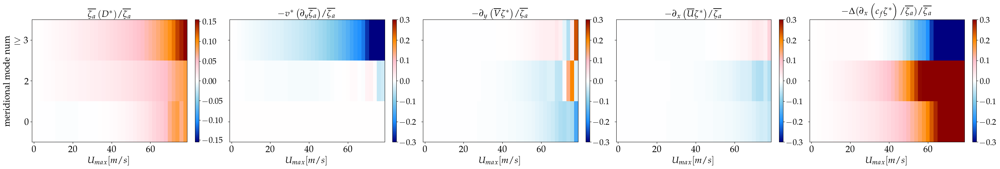

In [227]:
exp='500_40'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax1({}, cmap2, exp=exp)

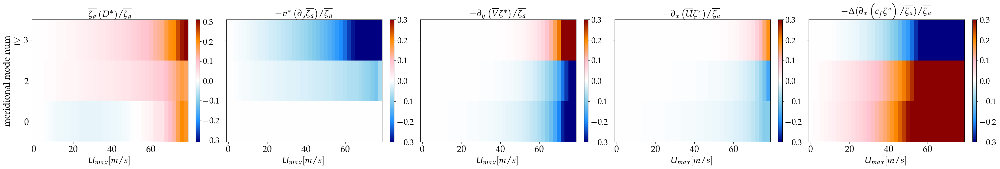

In [228]:
exp='500_60'
mode_vorticity_eq[exp] = plot_contourf_vorticity_equation_as_a_function_of_mode_and_Umax1({}, cmap2, exp=exp)

## Look at vorticity budget and change in divergence

In [100]:
py.rcParams.update( {   "text.usetex": False,
                        "font.family": "serif",
                        "font.serif": ["Palatino"] } )

def plot_divergence_decomposition(dicti = master_dict['200_0']):

        cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", 
              [  "maroon", "darkorange", "pink", "white", "white","skyblue", "dodgerblue", "navy"][::-1])

        fig, axs = py.subplots(1, 3, figsize=(20,6), sharey=True, sharex=True, constrained_layout=True)

        umax_values = np.sort([int(i) for i in dicti['raw_field_dict'].keys()])
        # umax_str = [str(u) for u in umax_values]

        UMAX = umax_values
        keys = ['div', 'div_x', 'div_y', ]

        var_name = dicti['vrt_var_name']

        cmap2=py.get_cmap("rainbow")

        R= 6371e3
        c = -1
        for key in tqdm(keys):  
            c = c+1       
            AX = axs[c]   
            for Umax in (UMAX) :
                ds     = dicti['raw_field_dict'][str(Umax)]
                de     = dicti['vrt_budget_dict'][str(Umax)]
                SCALE  = R
                LRANGE = np.arange(-0.3, 0.32, 0.02); # lrange(de[key]*SCALE) 

                norm = float(Umax)/np.max(umax_values)
                forcing_region_field = forcing_region( SCALE*eddy(de[key]), ds['phi_forcing'], sign=1, scale=1000)
                im = AX.plot( ds['lat'],  np.nanmean(forcing_region_field, axis=-1), c = cmap2(norm), lw=4)   
            AX.axhline(0, color='k')
            AX.set_xlim(-20,20)
            AX.tick_params(labelsize=15)
            AX.set_xlabel(None, size=20,  labelpad=0.9)
            AX.set_ylabel(None, size=20,  labelpad=0.6)
            AX.set_title(var_name[key], fontsize=22)

            # sm = py.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.BoundaryNorm(UMAX, cmap2.N))  
            # colorbar2(fontsize=20, im=sm, AX=AX, fig=fig, )

        ## Add a colorbar ##
        sm = mpl.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.BoundaryNorm(UMAX, cmap2.N))  
        cbar = fig.colorbar(sm, ax=axs.ravel().tolist(), location='bottom', aspect=30, shrink=0.5)
        for t in cbar.ax.get_xticklabels():
            t.set_fontsize(20)
        ## Add a colorbar ##

        ### To set common x and y axis ###
        py.setp(axs[:],  xlabel='latitude',)
        py.setp(axs[0],  ylabel='Scaled Divergence \n near forcing',)
        ### To set common x and y axis ###

        ### To set a label for color bar ###
        cbar.set_label(r'U$_{max}$ [$ms^{-1}$, colors]', \
                       loc = 'center', labelpad=-90, y=1.05, rotation=0, fontsize=22, color='k')
        fig.show()


100%|██████████| 3/3 [00:00<00:00, 20.08it/s]
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Palatino
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Palatino
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Palatino


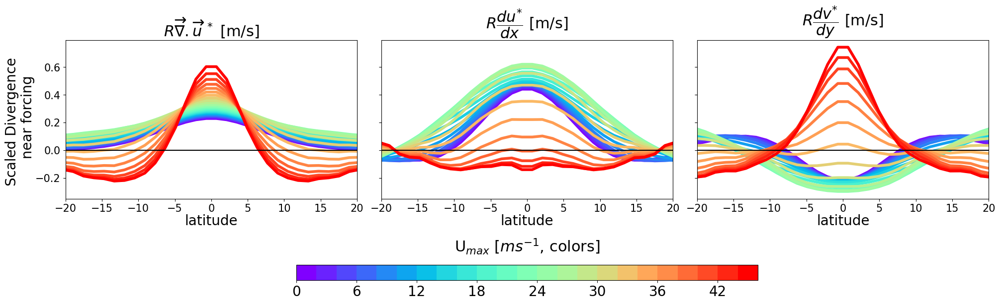

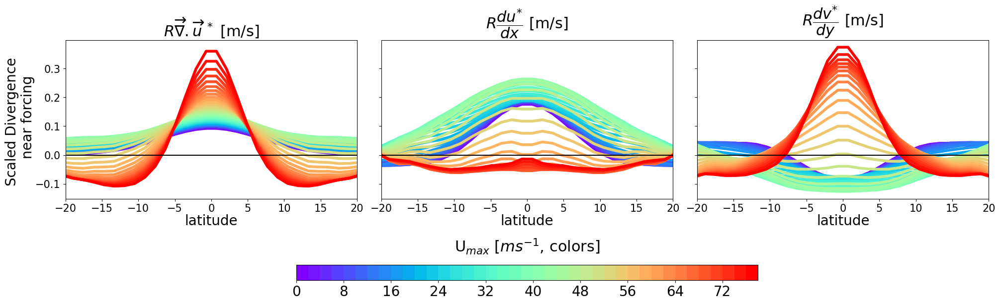

In [101]:
plot_divergence_decomposition(dicti = master_dict['200_0'])
plot_divergence_decomposition(dicti = master_dict['500_0'])

100%|██████████| 3/3 [00:00<00:00, 20.17it/s]


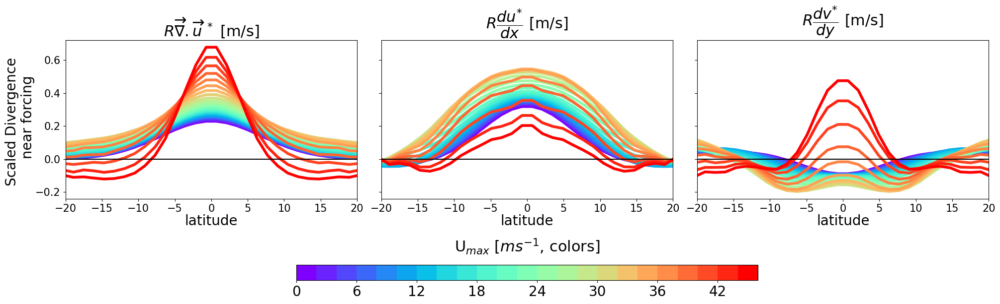

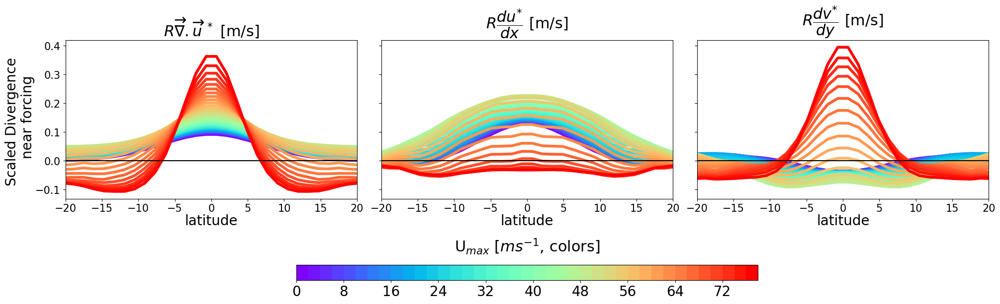

In [102]:
plot_divergence_decomposition(dicti = master_dict['200_5'])
plot_divergence_decomposition(dicti = master_dict['500_5'])

In [177]:
master_dict['200_0']['vrt_var_name']['zonal_wind_term']

'$-\\partial_x\\left({\\overline{U}\\zeta^{*}}\\right)$'

In [216]:
py.rcParams.update( {   "text.usetex": True,
                        "font.family": "serif",
                        "font.serif": ["Palatino"] } )

def plot_vrt_budget_regime1(dicti = master_dict['200_0']):

        cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", 
              [  "maroon", "darkorange", "pink", "white", "white","skyblue", "dodgerblue", "navy"][::-1])

        fig, axs = py.subplots(1, 5, figsize=(25,6), sharey=True, sharex=True, constrained_layout=True)

        umax_values = np.sort([int(i) for i in dicti['raw_field_dict'].keys()])
        umax_values = umax_values[:len(umax_values)//2]
        UMAX = umax_values

        keys = ['ZETA_a_D', 'beta_term', 'hadley_term', 'zonal_wind_term', 'cf_term']

        var_name            = dicti['vrt_var_name']
        var_name['cf_term'] = '$\\partial_x\\left({{c_f}\\zeta^{*}}\\right)$'
        
        cmap2=py.get_cmap("rainbow")

        R= 6371e3
        c = -1
        for key in tqdm(keys):  
            c = c+1       
            AX = axs[c]   
            for Umax in (UMAX) :
                ds     = dicti['raw_field_dict'][str(Umax)]
                de     = dicti['vrt_budget_dict'][str(Umax)]
                SCALE  = R
                LRANGE = np.arange(-0.3, 0.32, 0.02); # lrange(de[key]*SCALE) 

                norm = float(Umax)/np.max(umax_values)
                forcing_region_field = forcing_region( SCALE*eddy(de[key])/de['ZETA_a'], ds['phi_forcing'], sign=1, scale=1000)
                im = AX.plot( ds['lat'],  np.nanmean(forcing_region_field, axis=-1), c = cmap2(norm), lw=4)   
            AX.axhline(0, color='k')
            AX.set_xlim(-20,20)
            AX.tick_params(labelsize=15)
            AX.set_xlabel(None, size=20,  labelpad=0.9)
            AX.set_ylabel(None, size=20,  labelpad=0.6)
            AX.set_title(var_name[key]+'$/\overline{\zeta_a}$', fontsize=22)

            # sm = py.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.BoundaryNorm(UMAX, cmap2.N))  
            # colorbar2(fontsize=20, im=sm, AX=AX, fig=fig, )

        ## Add a colorbar ##
        sm = mpl.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.BoundaryNorm(UMAX, cmap2.N))  
        cbar = fig.colorbar(sm, ax=axs.ravel().tolist(), location='bottom', aspect=30, shrink=0.5)
        for t in cbar.ax.get_xticklabels():
            t.set_fontsize(20)
        ## Add a colorbar ##

        ### To set common x and y axis ###
        py.setp(axs[:],  xlabel='latitude',)
        py.setp(axs[0],  ylabel='Scaled Divergence \n near forcing',)
        ### To set common x and y axis ###

        ### To set a label for color bar ###
        cbar.set_label(r'U$_{max}$ [$ms^{-1}$, colors]', \
                       loc = 'center', labelpad=-90, y=1.05, rotation=0, fontsize=22, color='k')
        fig.show()


100%|██████████| 5/5 [00:00<00:00, 35.16it/s]


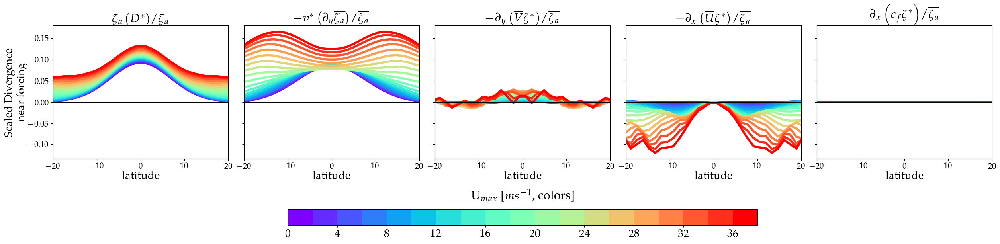

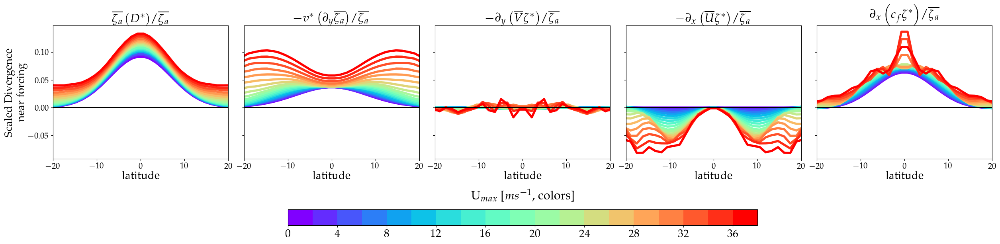

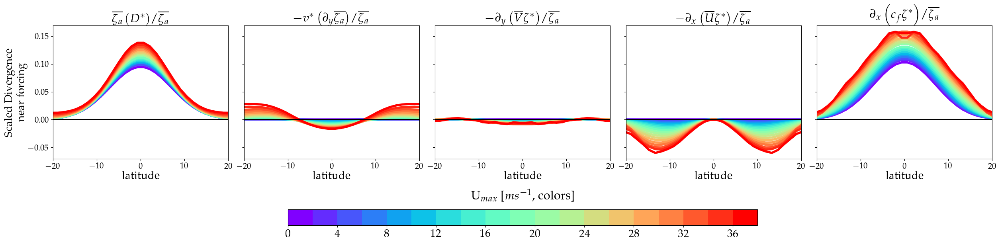

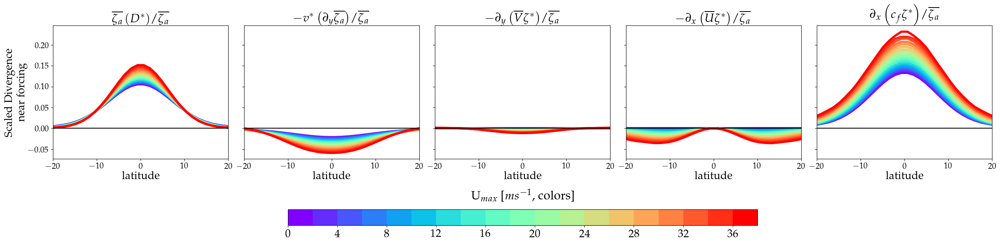

In [217]:
plot_vrt_budget_regime1(dicti =   master_dict['500_0'])
plot_vrt_budget_regime1(dicti =   master_dict['500_5'])
plot_vrt_budget_regime1(dicti =  master_dict['500_15'])
plot_vrt_budget_regime1(dicti =  master_dict['500_30'])

100%|██████████| 5/5 [00:00<00:00, 67.75it/s]


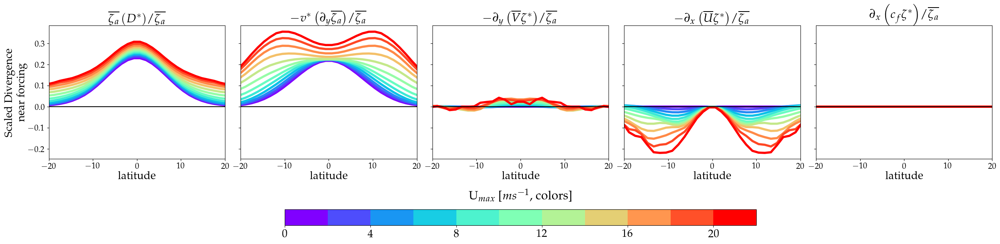

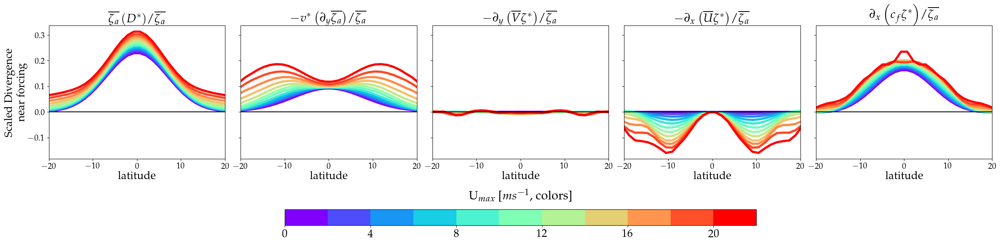

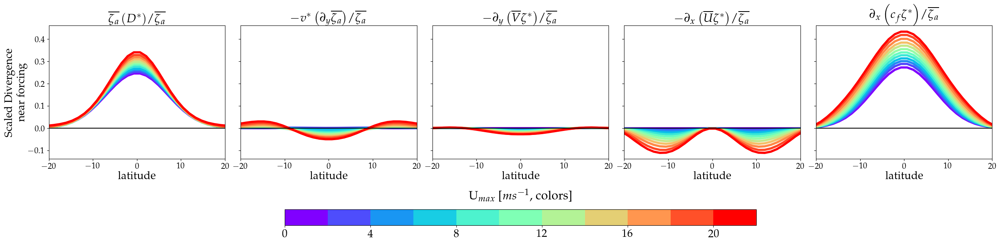

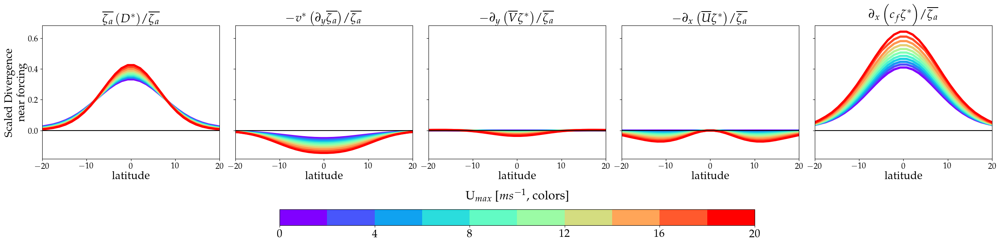

In [183]:
plot_vrt_budget_regime1(dicti =  master_dict['200_0'])
plot_vrt_budget_regime1(dicti =  master_dict['200_5'])
plot_vrt_budget_regime1(dicti = master_dict['200_15'])
plot_vrt_budget_regime1(dicti = master_dict['200_30'])

In [211]:
py.rcParams.update( {   "text.usetex": True,
                        "font.family": "serif",
                        "font.serif": ["Palatino"] } )

def plot_vrt_budget_regime2(dicti = master_dict['200_0'], yl=1):

        cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", 
              [  "maroon", "darkorange", "pink", "white", "white","skyblue", "dodgerblue", "navy"][::-1])

        fig, axs = py.subplots(1, 5, figsize=(25,6), sharey=True, sharex=True, constrained_layout=True)

        umax_values = np.sort([int(i) for i in dicti['raw_field_dict'].keys()])
        umax_values = umax_values[len(umax_values)//2 : ]
        UMAX = umax_values

        keys = ['ZETA_a_D', 'beta_term', 'hadley_term', 'zonal_wind_term', 'cf_term']

        var_name            = dicti['vrt_var_name']
        var_name['cf_term'] = '$\\partial_x\\left({{c_f}\\zeta^{*}}\\right)$'
        
        cmap2=py.get_cmap("rainbow")

        R= 6371e3
        c = -1
        for key in tqdm(keys):  
            c = c+1       
            AX = axs[c]   
            for Umax in (UMAX) :
                ds     = dicti['raw_field_dict'][str(Umax)]
                de     = dicti['vrt_budget_dict'][str(Umax)]
                SCALE  = R
                LRANGE = np.arange(-0.3, 0.32, 0.02); # lrange(de[key]*SCALE) 

                norm = float(Umax)/np.max(umax_values)
                forcing_region_field = forcing_region( SCALE*eddy(de[key])/de['ZETA_a'], ds['phi_forcing'], sign=1, scale=1000)
                im = AX.plot( ds['lat'],  np.nanmean(forcing_region_field, axis=-1), c = cmap2(norm), lw=4)   
            AX.axhline(0, color='k')
            AX.set_ylim(-yl, yl)
            AX.set_xlim(-20,20)
            AX.tick_params(labelsize=15)
            AX.set_xlabel(None, size=20,  labelpad=0.9)
            AX.set_ylabel(None, size=20,  labelpad=0.6)
            AX.set_title(var_name[key]+'$/\overline{\zeta_a}$', fontsize=22)

            # sm = py.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.BoundaryNorm(UMAX, cmap2.N))  
            # colorbar2(fontsize=20, im=sm, AX=AX, fig=fig, )

        ## Add a colorbar ##
        sm = mpl.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.BoundaryNorm(UMAX, cmap2.N))  
        cbar = fig.colorbar(sm, ax=axs.ravel().tolist(), location='bottom', aspect=30, shrink=0.5)
        for t in cbar.ax.get_xticklabels():
            t.set_fontsize(20)
        ## Add a colorbar ##

        ### To set common x and y axis ###
        py.setp(axs[:],  xlabel='latitude',)
        py.setp(axs[0],  ylabel='Scaled Divergence \n near forcing',)
        ### To set common x and y axis ###

        ### To set a label for color bar ###
        cbar.set_label(r'U$_{max}$ [$ms^{-1}$, colors]', \
                       loc = 'center', labelpad=-90, y=1.05, rotation=0, fontsize=22, color='k')
        fig.show()


100%|██████████| 5/5 [00:00<00:00, 37.93it/s]


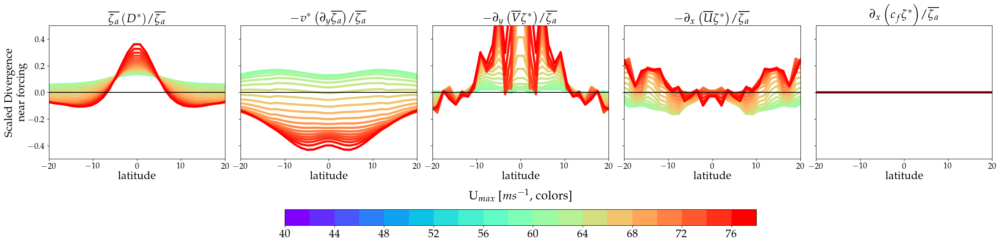

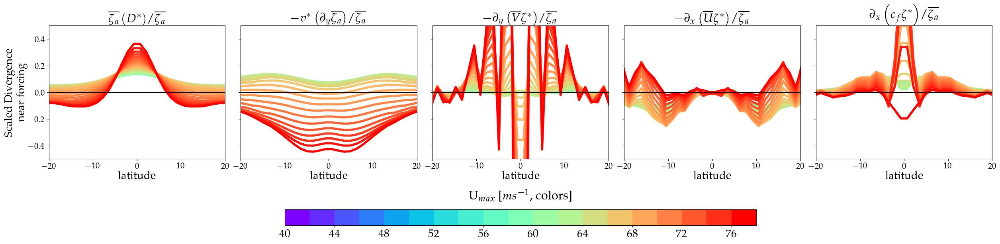

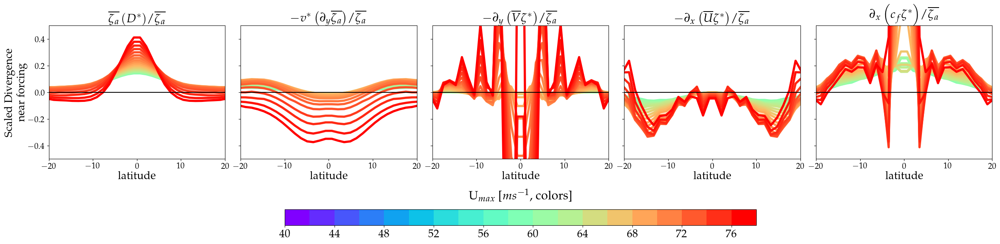

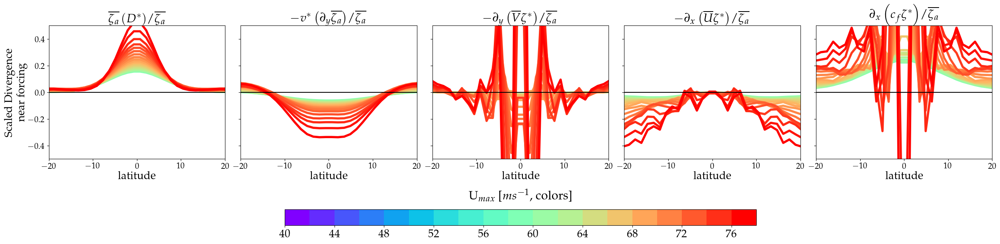

In [212]:
plot_vrt_budget_regime2(dicti =   master_dict['500_0'], yl=0.5)
plot_vrt_budget_regime2(dicti =   master_dict['500_5'], yl=0.5)
plot_vrt_budget_regime2(dicti =  master_dict['500_15'], yl=0.5)
plot_vrt_budget_regime2(dicti =  master_dict['500_30'], yl=0.5)

100%|██████████| 5/5 [00:00<00:00, 50.08it/s]


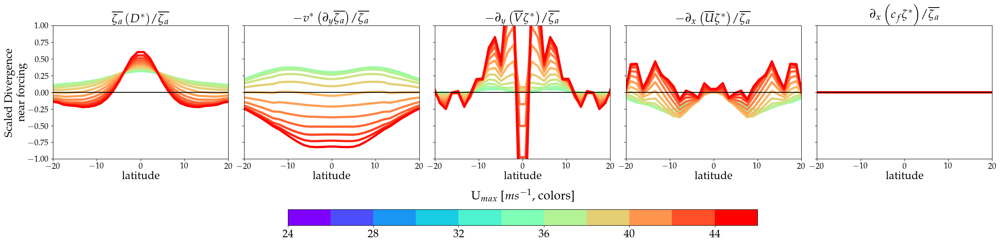

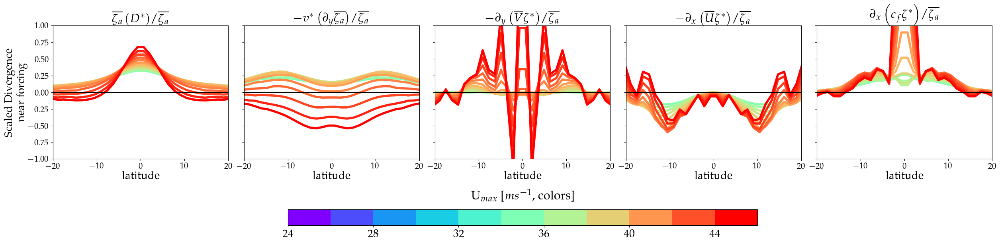

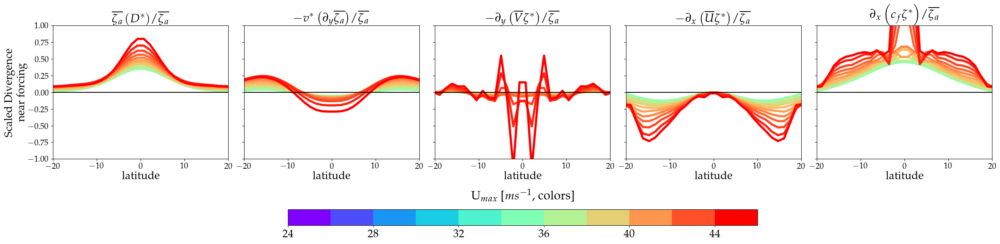

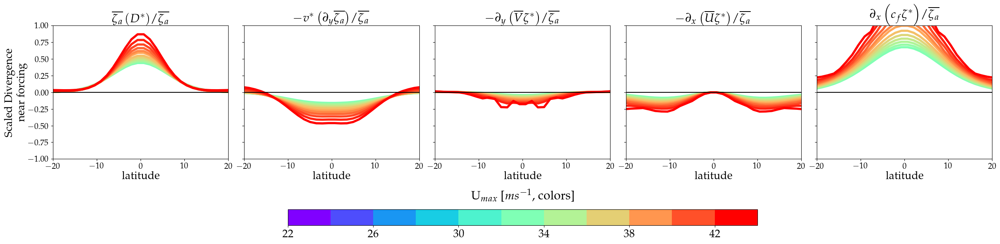

In [213]:
plot_vrt_budget_regime2(dicti =   master_dict['200_0'], yl=1)
plot_vrt_budget_regime2(dicti =   master_dict['200_5'], yl=1)
plot_vrt_budget_regime2(dicti =  master_dict['200_15'], yl=1)
plot_vrt_budget_regime2(dicti =  master_dict['200_30'], yl=1)

In [239]:
dicti['vrt_var_name']['ZETA_a_D']

'$\\overline{\\zeta_a} \\left(D^{*}\\right)$'

In [242]:
py.rcParams.update( {   "text.usetex": True,
                        "font.family": "serif",
                        "font.serif": ["Palatino"] } )

def plot_vrt_budget_regime1_modify(dicti = master_dict['200_0'], yl=0.5):

        cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", 
              [  "maroon", "darkorange", "pink", "white", "white","skyblue", "dodgerblue", "navy"][::-1])

        fig, axs = py.subplots(1, 4, figsize=(25,6), sharey=True, sharex=True, constrained_layout=True)

        umax_values = np.sort([int(i) for i in dicti['raw_field_dict'].keys()])
        umax_values = umax_values[:len(umax_values)//2]
        UMAX = umax_values

        keys = ['ZETA_a_D', 'beta_term', 'hadley_term', 'zonal_wind_term_minus_cf']

        var_name            = dicti['vrt_var_name']
        var_name['zonal_wind_term_minus_cf'] = '$-\\partial_x\\left({   (\\overline{U} - c_f)   \\zeta^{*}}\\right)$'
        
        cmap2=py.get_cmap("rainbow")

        R= 6371e3
        c = -1
        for key in tqdm(keys):  
            c = c+1       
            AX = axs[c]   
            for Umax in (UMAX) :
                ds     = dicti['raw_field_dict'][str(Umax)]
                de     = dicti['vrt_budget_dict'][str(Umax)]
                SCALE  = R
                LRANGE = np.arange(-0.3, 0.32, 0.02); # lrange(de[key]*SCALE) 

                norm = float(Umax)/np.max(umax_values)
                if key == 'zonal_wind_term_minus_cf':
                    plot_field = de['zonal_wind_term'] + de['cf_term']
                else:
                    plot_field = de[key]
                    
                forcing_region_field = forcing_region( SCALE*eddy(plot_field)/de['ZETA_a'], ds['phi_forcing'], sign=1, scale=1000)
                im = AX.plot( ds['lat'],  np.nanmean(forcing_region_field, axis=-1), c = cmap2(norm), lw=4)   
            AX.axhline(0, color='k')
            AX.set_xlim(-20,20)
            AX.tick_params(labelsize=15)
            AX.set_xlabel(None, size=20,  labelpad=0.9)
            AX.set_ylabel(None, size=20,  labelpad=0.6)
            
            if key == 'ZETA_a_D':
                tit = '$\\left(D^{*}\\right)$'
            else:
                tit = var_name[key]+'$/\overline{\zeta_a}$'
            AX.set_title(tit, fontsize=22)

        ## Add a colorbar ##
        sm = mpl.cm.ScalarMappable(cmap=cmap2, norm=mpl.colors.BoundaryNorm(UMAX, cmap2.N))  
        cbar = fig.colorbar(sm, ax=axs.ravel().tolist(), location='bottom', aspect=30, shrink=0.5)
        for t in cbar.ax.get_xticklabels():
            t.set_fontsize(20)
        ## Add a colorbar ##

        ### To set common x and y axis ###
        py.setp(axs[:],  xlabel='latitude',)
        py.setp(axs[0],  ylabel='Scaled Divergence \n near forcing',)
        ### To set common x and y axis ###

        ### To set a label for color bar ###
        cbar.set_label(r'U$_{max}$ [$ms^{-1}$, colors]', \
                       loc = 'center', labelpad=-90, y=1.05, rotation=0, fontsize=22, color='k')
        fig.show()


100%|██████████| 4/4 [00:00<00:00, 38.17it/s]


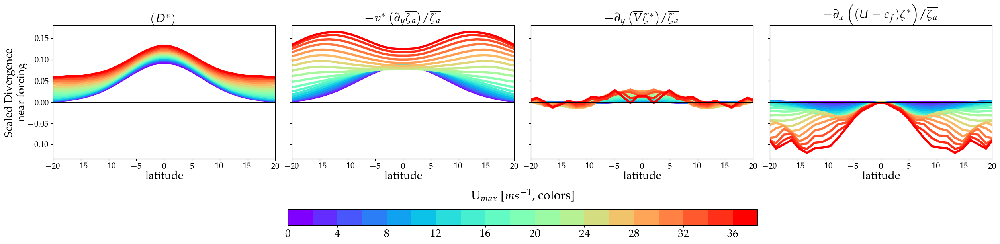

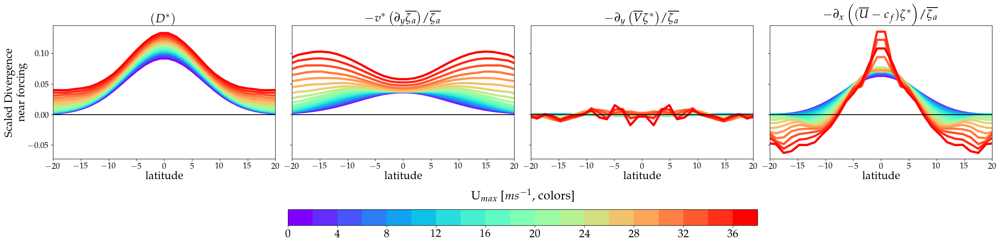

In [ ]:
plot_vrt_budget_regime1_modify(dicti =   master_dict['500_0'], yl=0.5)
plot_vrt_budget_regime1_modify(dicti =   master_dict['500_5'], yl=0.5)
plot_vrt_budget_regime1_modify(dicti =  master_dict['500_15'], yl=0.5)
plot_vrt_budget_regime1_modify(dicti =  master_dict['500_30'], yl=0.5)